In [ ]:
from google.colab import drive
drive.mount('/content/drive/') 
!ls "/content/drive/My Drive/"

In [2]:
!pip install SimpleITK

     |████████████████████████████████| 47.4MB 65kB/s 


In [3]:
import SimpleITK as sitk 
from tqdm import tqdm
import numpy as np
import os

In [42]:
mask = sitk.GetArrayFromImage(sitk.ReadImage('/content/drive/My Drive/BraTs2019/Training/LGG/BraTS19_2013_0_1/BraTS19_2013_0_1_seg.nii.gz')).transpose(1, 2, 0)


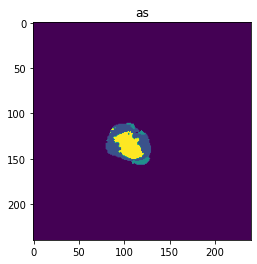

In [51]:
import matplotlib.pyplot as plt
plt.imshow(mask[:,:,60])
plt.title("as")
plt.show()

In [ ]:
path1 = '/content/drive/My Drive/BraTs2019/Training/HGG/'
path2 = '/content/drive/My Drive/BraTs2019/Training/LGG/'

In [ ]:
def load_data(path):
  my_dir = sorted(os.listdir(path))
  data = []
  gt = []
  for p in tqdm(my_dir):
    data_list = sorted(os.listdir(path+p))
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[0])
    flair = sitk.GetArrayFromImage(img_itk)
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[1])
    seg =  sitk.GetArrayFromImage(img_itk)
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[2])    
    t1 =  sitk.GetArrayFromImage(img_itk)
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[3])
    t1ce =  sitk.GetArrayFromImage(img_itk)
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[4])
    t2 =  sitk.GetArrayFromImage(img_itk)
    data.append([flair,t1,t1ce,t2])
    gt.append(seg)
    del seg,t1,t2,flair,t1ce,img_itk
  data = np.asarray(data,dtype=np.float32)
  gt = np.asarray(gt,dtype=np.uint8)
  return data,gt

In [ ]:
# for HGG
#data1,gt1 = load_data(path1)   #dividing HGG in three parts i.e. 210 into three sets of 70 
# for LGG
data2,gt2 = load_data(path2)  #LGG having 75 patients 

100%|██████████| 76/76 [04:29<00:00,  3.55s/it]


In [ ]:
data2.shape,gt2.shape,data2.dtype,gt2.dtype

((76, 4, 155, 240, 240), (76, 155, 240, 240), dtype('float32'), dtype('uint8'))

In [ ]:
data2

NameError: ignored

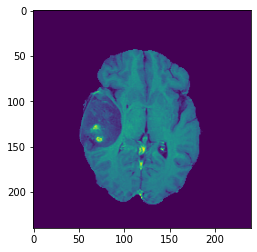

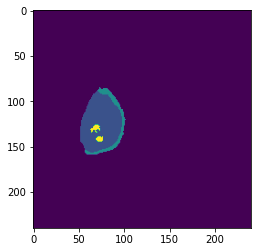

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(data2[45,2,65,:,:])
plt.show()
plt.imshow(gt2[45,65,:,:])
plt.show()

In [ ]:
np.save('/content/drive/My Drive/BraTs2019/Train/data2.npy',data2)
np.save('/content/drive/My Drive/BraTs2019/Train/gt2.npy',gt2)

In [ ]:
#load save data
data = np.load('/content/drive/My Drive/BraTs2019/Train/data2.npy')
gt = np.load('/content/drive/My Drive/BraTs2019/Train/gt2.npy')

In [ ]:
gt.shape

(76, 155, 240, 240)

In [ ]:
data = np.transpose(data,(0,2,3,4,1))

In [ ]:
data.shape,gt.shape,data.dtype,gt.dtype

((76, 155, 240, 240, 4), (76, 155, 240, 240), dtype('float32'), dtype('uint8'))

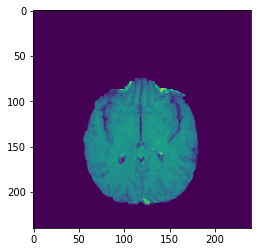

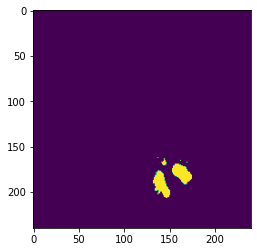

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(data[50,70,:,:,2])
plt.show()
plt.imshow(gt[50,70,:,:])
plt.show()

In [ ]:
data = data[:,30:120,30:222,30:222,:].reshape([-1,192,192,4])
gt = gt[:,30:120,30:222,30:222].reshape([-1,192,192,1])

array([[[[0],
         [0],
         [0],
         ...,
         [0],
         [0],
         [0]],

        [[0],
         [0],
         [0],
         ...,
         [0],
         [0],
         [0]],

        [[0],
         [0],
         [0],
         ...,
         [0],
         [0],
         [0]],

        ...,

        [[0],
         [0],
         [0],
         ...,
         [0],
         [0],
         [0]],

        [[0],
         [0],
         [0],
         ...,
         [0],
         [0],
         [0]],

        [[0],
         [0],
         [0],
         ...,
         [0],
         [0],
         [0]]],


       [[[0],
         [0],
         [0],
         ...,
         [0],
         [0],
         [0]],

        [[0],
         [0],
         [0],
         ...,
         [0],
         [0],
         [0]],

        [[0],
         [0],
         [0],
         ...,
         [0],
         [0],
         [0]],

        ...,

        [[0],
         [0],
         [0],
         ...,
         [0],


In [ ]:
data.shape,gt.shape

((6840, 192, 192, 4), (6840, 192, 192, 1))

In [ ]:
gt[np.where(gt==4)]=3   #converting ground truth value of 4 to 3 to do one hot encoding (Consider value 3 in results in output as class 4)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(data, gt, test_size=0.20, random_state=42)
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.25,random_state=42)

In [ ]:
X_train.shape,Y_train.shape,X_val.shape,Y_val.shape

((4104, 192, 192, 4),
 (4104, 192, 192, 1),
 (1368, 192, 192, 4),
 (1368, 192, 192, 1))

In [ ]:
X_train

array([[[[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         ...,
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]],

        [[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         ...,
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]],

        [[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         ...,
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]],

        ...,

        [[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         ...,
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]],

        [[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         ...,
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]],

        [[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         ...,
 

In [ ]:
%tensorflow_version 1.x

TensorFlow is already loaded. Please restart the runtime to change versions.


In [ ]:
from keras.utils import to_categorical,normalize
Y_train = to_categorical(Y_train)
Y_val = to_categorical(Y_val)
X_train = (X_train-np.mean(X_train))/np.max(X_train)
X_test = (X_test-np.mean(X_test))/np.max(X_test)
X_val = (X_val-np.mean(X_val))/np.max(X_val)

In [ ]:
X_train.shape,Y_train.shape, X_val.shape, Y_val.shape, X_test.shape, Y_test.shape

((4104, 192, 192, 4),
 (4104, 192, 192, 4),
 (1368, 192, 192, 4),
 (1368, 192, 192, 4),
 (1368, 192, 192, 4),
 (1368, 192, 192, 1))

In [ ]:
Y_train

array([[[[1., 0., 0., 0.],
         [1., 0., 0., 0.],
         [1., 0., 0., 0.],
         ...,
         [1., 0., 0., 0.],
         [1., 0., 0., 0.],
         [1., 0., 0., 0.]],

        [[1., 0., 0., 0.],
         [1., 0., 0., 0.],
         [1., 0., 0., 0.],
         ...,
         [1., 0., 0., 0.],
         [1., 0., 0., 0.],
         [1., 0., 0., 0.]],

        [[1., 0., 0., 0.],
         [1., 0., 0., 0.],
         [1., 0., 0., 0.],
         ...,
         [1., 0., 0., 0.],
         [1., 0., 0., 0.],
         [1., 0., 0., 0.]],

        ...,

        [[1., 0., 0., 0.],
         [1., 0., 0., 0.],
         [1., 0., 0., 0.],
         ...,
         [1., 0., 0., 0.],
         [1., 0., 0., 0.],
         [1., 0., 0., 0.]],

        [[1., 0., 0., 0.],
         [1., 0., 0., 0.],
         [1., 0., 0., 0.],
         ...,
         [1., 0., 0., 0.],
         [1., 0., 0., 0.],
         [1., 0., 0., 0.]],

        [[1., 0., 0., 0.],
         [1., 0., 0., 0.],
         [1., 0., 0., 0.],
         ...,
 

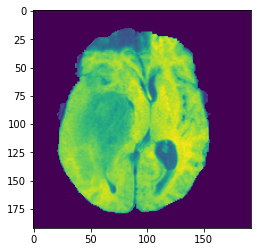

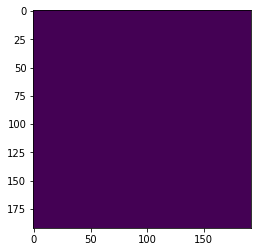

In [ ]:
plt.imshow(X_train[1,:,:,1])
plt.show()
plt.imshow(Y_train[1,:,:,3])
plt.show()

In [ ]:
#Saving the data one by one total set 4
np.save('/content/drive/My Drive/BraTs2019/X_train4.npy',X_train)
np.save('/content/drive/My Drive/BraTs2019/Y_train4.npy',Y_train)
np.save('/content/drive/My Drive/BraTs2019/X_val4.npy',X_val)
np.save('/content/drive/My Drive/BraTs2019/Y_val4.npy',Y_val)
np.save('/content/drive/My Drive/BraTs2019/X_test4.npy',X_test)
np.save('/content/drive/My Drive/BraTs2019/Y_test4.npy',Y_test)

In [ ]:
#load the data one by one total set 4
X_train=np.load('/content/drive/My Drive/BraTs2019/X_train4.npy')
Y_train=np.load('/content/drive/My Drive/BraTs2019/Y_train4.npy')
X_val=np.load('/content/drive/My Drive/BraTs2019/X_val4.npy')
Y_val=np.load('/content/drive/My Drive/BraTs2019/Y_val4.npy')
X_test=np.load('/content/drive/My Drive/BraTs2019/X_test4.npy')
Y_test=np.load('/content/drive/My Drive/BraTs2019/Y_test4.npy')

In [ ]:
X_train = np.load('/content/drive/My Drive/BraTs2019/X_train4.npy')
Y_train = np.load('/content/drive/My Drive/BraTs2019/Y_train4.npy')
X_val = np.load('/content/drive/My Drive/BraTs2019/X_val4.npy')
Y_val = np.load('/content/drive/My Drive/BraTs2019/Y_val4.npy')

Implementing Capsule model


In [ ]:
!pip install tensorflow==1.14.0
!pip install keras==2.2.4

In [ ]:
print(tf.__version__)

1.14.0


In [ ]:
from keras.preprocessing.image import array_to_img
from keras.utils.vis_utils import plot_model
from keras.utils import to_categorical

from keras import layers, models, optimizers,initializers
from keras.models import Model, Sequential, load_model
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout, Input, Reshape, Layer, Lambda
from keras.callbacks import ModelCheckpoint, EarlyStopping, LearningRateScheduler
from keras.optimizers import Adam, SGD
from keras import backend as K
import pandas as pd
import numpy as np
import keras
from keras.models import Model
from keras.layers import Conv2D, Dense, Input, Reshape, Lambda, Layer, Flatten
from keras import backend as K
import matplotlib.pyplot as plt

import tensorflow as tf
from keras import initializers
from keras.utils import to_categorical
from keras.layers.core import Activation

Using TensorFlow backend.
/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarn

In [ ]:
#Build the Capsule Model
#Convolutional layer
input_shape = Input(shape=(192,192,4))  
conv1 = Conv2D(336, (9,9), activation = 'relu', padding = 'valid')(input_shape)

In [ ]:
#Primary Capsule Layer
# convolution layer with stride 2 and 256 filters of size 9*9
conv2 = Conv2D(336, (9,9), strides = 2, padding = 'valid')(conv1)
 
# reshape into 1152 capsules of 8 dimensional vectors
reshaped = Reshape((-1,8))(conv2)
 
def squash(inputs):
    # take norm of input vectors
    squared_norm = K.sum(K.square(inputs), axis = -1, keepdims = True)
 
    # use the formula for non-linear function to return squashed output
    return ((squared_norm/(1+squared_norm))/(K.sqrt(squared_norm+K.epsilon())))*inputs

# squash the reshaped output to make length of vector b/w 0 and 1
squashed_output = Lambda(squash)(reshaped)

In [ ]:
#Digit Capsule Layer
class DigitCapsuleLayer(Layer):
    # creating a layer class in keras
    def __init__(self, **kwargs):
        super(DigitCapsuleLayer, self).__init__(**kwargs)
        self.kernel_initializer = initializers.get('glorot_uniform')
    
    def build(self, input_shape): 
        # initialize weight matrix for each capsule in lower layer
        self.W = self.add_weight(shape = [4, 6*6*42, 16, 8], initializer = self.kernel_initializer, name = 'weights')
        self.built = True
    
    def call(self, inputs):
        inputs = K.expand_dims(inputs, 1)
        inputs = K.tile(inputs, [1, 4, 1, 1])
        # matrix multiplication b/w previous layer output and weight matrix
        inputs = K.map_fn(lambda x: K.batch_dot(x, self.W, [2, 3]), elems=inputs)
        b = tf.zeros(shape = [K.shape(inputs)[0], 4, 6*6*42])
        
# routing algorithm with updating coupling coefficient c, using scalar product b/w input capsule and output capsule
        for i in range(3-1):
            c = tf.nn.softmax(b, axis=1)
            s = K.batch_dot(c, inputs, axes=[2, 2])
            v = squash(s)
            
            b = b + K.batch_dot(v, inputs, axes=[2,3])
            
        return v 
    def compute_output_shape(self, input_shape):
        return tuple([None, 4, 16])
    
    
    
def output_layer(inputs):
    return K.sqrt(K.sum(K.square(inputs), -1) + K.epsilon())
 
digit_caps = DigitCapsuleLayer()(squashed_output)
outputs = Lambda(output_layer)(digit_caps)

In [ ]:
#Decoder Network
def mask(outputss):
 
    if type(outputss) != list:  # mask at test time
        norm_outputs = K.sqrt(K.sum(K.square(outputss), -1) + K.epsilon())
        y  = K.one_hot(indices=K.argmax(norm_outputs, 1), num_classes = 10)
        y = Reshape((4,1))(y)
        return Flatten()(y*outputss)
 
    else:    # mask at train time
        y = Reshape((4,1))(outputss[1])
        masked_output = y*outputss[0]
        return Flatten()(masked_output)
    
inputs = Input(shape = (10,))
masked = Lambda(mask)([digit_caps, inputs])
masked_for_test = Lambda(mask)(digit_caps)
 
decoded_inputs = Input(shape = (16*4,))
dense1 = Dense(512, activation = 'relu')(decoded_inputs)
dense2 = Dense(1024, activation = 'relu')(dense1)
decoded_outputs = Dense(784, activation = 'sigmoid')(dense2)
decoded_outputs = Reshape((192,192,4))(decoded_outputs)

In [ ]:
from keras import backend as K
def dice_coef(y_true, y_pred, epsilon=1e-6):
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    return (2. * intersection) / (K.sum(K.square(y_true),axis=-1) + K.sum(K.square(y_pred),axis=-1) + epsilon)

def dice_coef_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)

In [ ]:
decoder = Model(decoded_inputs, decoded_outputs)
model = Model([input_shape,inputs],[outputs,decoder(masked)])
test_model = Model(input_shape,[outputs,decoder(masked_for_test)])
 
m = 128
epochs = 10
#model.compile(optimizer=keras.optimizers.Adam(lr=0.001),loss=[loss_fn,'mse'],loss_weights = [1. ,0.0005],metrics=['accuracy'])
model.compile(optimizer=Adam(lr=1e-5),loss=dice_coef_loss,metrics=[dice_coef])
model.fit([x_train, y_train],[y_train,x_train],batch_size = m, epochs = epochs, validation_data = ([x_test, y_test],[y_test,x_test]))
history = model.fit(X_train,Y_train,validation_data=(X_val,Y_val),batch_size=32,epochs=2,shuffle=True)

Capsule network 2


In [ ]:
class LengthLayer(Layer):
    def call(self, inputs, **kwargs):
        return tf.sqrt(tf.reduce_sum(tf.square(inputs), axis=-1, keep_dims=False))

    def compute_output_shape(self, input_shape):
        *output_shape, _ = input_shape
        return tuple(output_shape)
class MaskingLayer(Layer):
    def call(self, inputs, **kwargs):
        input, mask = inputs
        return K.batch_dot(input, mask, 1)

    def compute_output_shape(self, input_shape):
        *_, output_shape = input_shape[0]
        return (None, output_shape)
def squash(output_vector, axis=-1):
  norm = tf.reduce_sum(tf.square(output_vector), axis, keep_dims=True)
  return output_vector * norm / ((1 + norm) * tf.sqrt(norm + 1.0e-10))
  
class CapsuleLayer(Layer):
    def __init__(self, n_capsule, n_vec, n_routing, **kwargs):
        super(CapsuleLayer, self).__init__(**kwargs)
        self.n_capsule = n_capsule
        self.n_vector = n_vec
        self.n_routing = n_routing
        self.kernel_initializer = initializers.get('he_normal')
        self.bias_initializer = initializers.get('zeros')

    def build(self, input_shape): # input_shape is a 4D tensor
        _, self.input_n_capsule, self.input_n_vector, *_ = input_shape
        self.W = self.add_weight(shape=[self.input_n_capsule, self.n_capsule, self.input_n_vector, self.n_vector], initializer=self.kernel_initializer, name='W')
        self.bias = self.add_weight(shape=[1, self.input_n_capsule, self.n_capsule, 1, 1], initializer=self.bias_initializer, name='bias', trainable=False)
        self.built = True

    def call(self, inputs, training=None):
        input_expand = tf.expand_dims(tf.expand_dims(inputs, 2), 2)
        input_tiled = tf.tile(input_expand, [1, 1, self.n_capsule, 1, 1])
        input_hat = tf.scan(lambda ac, x: K.batch_dot(x, self.W, [3, 2]), elems=input_tiled, initializer=K.zeros( [self.input_n_capsule, self.n_capsule, 1, self.n_vector]))
        for i in range(self.n_routing): # routing
            c = tf.nn.softmax(self.bias, dim=2)
            outputs = squash(tf.reduce_sum( c * input_hat, axis=1, keep_dims=True))
            if i != self.n_routing - 1:
                self.bias += tf.reduce_sum(input_hat * outputs, axis=-1, keep_dims=True)
        return tf.reshape(outputs, [-1, self.n_capsule, self.n_vector])

    def compute_output_shape(self, input_shape):
        # output current layer capsules
        return (None, self.n_capsule, self.n_vector)

    def get_config(self):
      # For serialization with 'custom_objects'
      config = super().get_config()
      config['n_capsule'] = self.n_capsule
      config['n_vec'] = self.n_vector
      config['n_routing'] = self.n_routing
      return config
        
    # def get_config(self):
    #   config = {
    #         'n_capsule': self.n_capsule,
    #         'n_vec': self.n_vector,
    #         'n_routing': self.n_routing
    #     }
    #   base_config = super(CapsuleLayer, self).get_config()
    #   return dict(list(base_config.items()) + list(config.items()))
def PrimaryCapsule(n_vector, n_channel, n_kernel_size, n_stride, padding='valid'):
    def builder(inputs):
        output = Conv2D(filters=n_vector * n_channel, kernel_size=n_kernel_size, strides=n_stride, padding=padding)(inputs)
        output = Reshape( target_shape=[-1, n_vector], name='primary_capsule_reshape')(output)
        return Lambda(squash, name='primary_capsule_squash')(output)
    return builder




In [ ]:

INPUT_SHAPE = (192, 192, 4)
input_shape=INPUT_SHAPE
print("input_shape shape => {}".format(INPUT_SHAPE))
x = Input(shape=input_shape)
conv1 = Conv2D(filters=64, kernel_size=9, strides=1, padding='valid', activation='relu', name='conv1')(x)
print("conv1 shape => {}".format(conv1.shape))
  #n_vector  => dimensions 
  #n_channel = “Component Capsules” 
primary_capsule = PrimaryCapsule( n_vector=8, n_channel=32, n_kernel_size=9, n_stride=2)(conv1)

print("primary_capsule shape => {}".format(primary_capsule.shape))
digit_capsule = CapsuleLayer( n_capsule=4, n_vec=16, n_routing=3, name='digit_capsule')(primary_capsule)
print("digit_capsule shape => {}".format(digit_capsule.shape))
outputs = LengthLayer(name='output_capsule')(digit_capsule)
print("outputs shape => {}".format(outputs.shape))



  # mask_input = Input(shape=(n_class, ))
  # mask = MaskingLayer()([digit_capsule, mask_input])  # two inputs
  # dec = Dense(512, activation='relu')(mask)
  # dec = Dense(1024, activation='relu')(dec)
  # dec = Dense(np.prod(input_shape), activation='softmax')(dec)
  # dec = Reshape(input_shape)(dec)

  # d = Flatten(name='flatten')(output_capsule)
  # d = Dense(512, activation='relu', name='fc1')(d)
  # d = Dense(1024, activation='relu', name='fc2')(d)
  # d = Dense(1, activation='sigmoid', name='fc3')(d)

  # model = Model(x, output_capsule)


input_shape shape => (192, 192, 4)
conv1 shape => (?, 184, 184, 64)
primary_capsule shape => (?, ?, 8)
digit_capsule shape => (?, 4, 16)
outputs shape => (?, 4)


In [ ]:
digit_capsule

<tf.Tensor 'digit_capsule_3/Reshape:0' shape=(?, 4, 16) dtype=float32>

In [ ]:
#Decoder Network
def mask(outputss):
 
    if type(outputss) != list:  # mask at test time
        norm_outputs = K.sqrt(K.sum(K.square(outputss), -1) + K.epsilon())
        y  = K.one_hot(indices=K.argmax(norm_outputs, 1), num_classes = 4)
        y = Reshape((4,1))(y)
        return Flatten()(y*outputss)
 
    else:    # mask at train time
        print("mask value in else part",outputss[1])
        y = Reshape((4,1))(outputss[1])
        print("mask value in else part y",np.shape(y))
        masked_output = y*outputss[0]
        return Flatten()(masked_output)
    
inputs = Input(shape = (4,))
masked = Lambda(mask)([digit_capsule, inputs])
print("masked value",masked)
masked_for_test = Lambda(mask)(digit_capsule)
 
decoded_inputs = Input(shape = (16*4,))
dense1 = Dense(512, activation = 'relu')(decoded_inputs)
dense2 = Dense(1024, activation = 'relu')(dense1)
decoded_outputs = Dense(147456, activation = 'sigmoid')(dense2)
decoded_outputs = Reshape((192,192,4))(decoded_outputs)

mask value in else part Tensor("input_5:0", shape=(?, 4), dtype=float32)
mask value in else part y (?, 4, 1)
mask value in else part Tensor("lambda_1/Placeholder_1:0", shape=(?, 4), dtype=float32)
mask value in else part y (?, 4, 1)
masked value Tensor("lambda_1/flatten_1/Reshape:0", shape=(?, ?), dtype=float32)


In [ ]:
from keras import backend as K
def dice_coef(y_true, y_pred, epsilon=1e-6):
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    return (2. * intersection) / (K.sum(K.square(y_true),axis=-1) + K.sum(K.square(y_pred),axis=-1) + epsilon)

def dice_coef_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)

In [ ]:


decoder = Model(decoded_inputs, decoded_outputs)
model = Model([x,inputs],[outputs,decoder(masked)])
test_model = Model(x,[outputs,decoder(masked_for_test)])
 
m = 32
epochs = 2
#model.compile(optimizer=keras.optimizers.Adam(lr=0.001),loss=[loss_fn,'mse'],loss_weights = [1. ,0.0005],metrics=['accuracy'])
model.compile(optimizer=Adam(lr=1e-5),loss=dice_coef_loss,metrics=[dice_coef])
model.summary()
model.fit([X_train, Y_train],[Y_train,X_train],batch_size = m, epochs = epochs, validation_data = ([X_val, Y_val],[Y_val,Y_val]))



__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 192, 192, 4)  0                                            
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 184, 184, 64) 20800       input_4[0][0]                    
__________________________________________________________________________________________________
conv2d_4 (Conv2D)               (None, 88, 88, 256)  1327360     conv1[0][0]                      
__________________________________________________________________________________________________
primary_capsule_reshape (Reshap (None, 247808, 8)    0           conv2d_4[0][0]                   
__________________________________________________________________________________________________
primary_c

ValueError: ignored

In [ ]:
Y_train.shape

(4104, 192, 192, 4)

In [ ]:
X_train.shape

(4104, 192, 192, 4)

U-NET model

In [ ]:
from keras.models import Model
from keras.layers import MaxPooling2D,Conv2D,Dense,BatchNormalization,concatenate,Input,Dropout,Maximum,Activation,Dense,Flatten,UpSampling2D,Conv2DTranspose
from keras.optimizers import SGD,Adam,RMSprop
import keras.callbacks as callbacks
import keras.initializers as initializers
from keras.callbacks import Callback
from keras import regularizers

In [ ]:
############################################ U-net #############################################

############ Encoder #############
input_ = Input(shape=(192,192,4),name='input')                                              

block1_conv1 = Conv2D(64,3,padding='same',activation='relu',name='block1_conv1')(input_)
block1_conv2 = Conv2D(64,3,padding='same',activation='relu',name='block1_conv2')(block1_conv1)
block1_norm = BatchNormalization(name='block1_batch_norm')(block1_conv2)
block1_pool = MaxPooling2D(name='block1_pool')(block1_norm)

block2_conv1 = Conv2D(128,3,padding='same',activation='relu',name='block2_conv1')(block1_pool)
block2_conv2 = Conv2D(128,3,padding='same',activation='relu',name='block2_conv2')(block2_conv1)
block2_norm = BatchNormalization(name='block2_batch_norm')(block2_conv2)
block2_pool = MaxPooling2D(name='block2_pool')(block2_norm)

encoder_dropout_1 = Dropout(0.2,name='encoder_dropout_1')(block2_pool)

block3_conv1 = Conv2D(256,3,padding='same',activation='relu',name='block3_conv1')(encoder_dropout_1)
block3_conv2 = Conv2D(256,3,padding='same',activation='relu',name='block3_conv2')(block3_conv1)
block3_norm = BatchNormalization(name='block3_batch_norm')(block3_conv2)
block3_pool = MaxPooling2D(name='block3_pool')(block3_norm)

block4_conv1 = Conv2D(512,3,padding='same',activation='relu',name='block4_conv1')(block3_pool)
block4_conv2 = Conv2D(512,3,padding='same',activation='relu',name='block4_conv2')(block4_conv1)
block4_norm = BatchNormalization(name='block4_batch_norm')(block4_conv2)
block4_pool = MaxPooling2D(name='block4_pool')(block4_norm)
################### Encoder end ######################

block5_conv1 = Conv2D(1024,3,padding='same',activation='relu',name='block5_conv1')(block4_pool)
# encoder_dropout_2 = Dropout(0.2,name='encoder_dropout_2')(block5_conv1)

########### Decoder ################

up_pool1 = Conv2DTranspose(1024,3,strides = (2, 2),padding='same',activation='relu',name='up_pool1')(block5_conv1)
merged_block1 = concatenate([block4_norm,up_pool1],name='merged_block1')
decod_block1_conv1 = Conv2D(512,3, padding = 'same', activation='relu',name='decod_block1_conv1')(merged_block1)

up_pool2 = Conv2DTranspose(512,3,strides = (2, 2),padding='same',activation='relu',name='up_pool2')(decod_block1_conv1)
merged_block2 = concatenate([block3_norm,up_pool2],name='merged_block2')
decod_block2_conv1 = Conv2D(256,3,padding = 'same',activation='relu',name='decod_block2_conv1')(merged_block2)

decoder_dropout_1 = Dropout(0.2,name='decoder_dropout_1')(decod_block2_conv1)

up_pool3 = Conv2DTranspose(256,3,strides = (2, 2),padding='same',activation='relu',name='up_pool3')(decoder_dropout_1)
merged_block3 = concatenate([block2_norm,up_pool3],name='merged_block3')
decod_block3_conv1 = Conv2D(128,3,padding = 'same',activation='relu',name='decod_block3_conv1')(merged_block3)

up_pool4 = Conv2DTranspose(128,3,strides = (2, 2),padding='same',activation='relu',name='up_pool4')(decod_block3_conv1)
merged_block4 = concatenate([block1_norm,up_pool4],name='merged_block4')
decod_block4_conv1 = Conv2D(64,3,padding = 'same',activation='relu',name='decod_block4_conv1')(merged_block4)
############ Decoder End ######################################

# decoder_dropout_2 = Dropout(0.2,name='decoder_dropout_2')(decod_block4_conv1)

pre_output = Conv2D(64,1,padding = 'same',activation='relu',name='pre_output')(decod_block4_conv1)

output = Conv2D(4,1,padding='same',activation='softmax',name='output')(pre_output)

model = Model(inputs = input_, outputs = output)
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              [(None, 192, 192, 4) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 192, 192, 64) 2368        input[0][0]                      
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 192, 192, 64) 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_batch_norm (BatchNormali (None, 192, 192, 64) 256         block1_conv2[0][0]               
______________________________________________________________________________________________

In [ ]:
from keras import backend as K
def dice_coef(y_true, y_pred, epsilon=1e-6):
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    return (2. * intersection) / (K.sum(K.square(y_true),axis=-1) + K.sum(K.square(y_pred),axis=-1) + epsilon)

def dice_coef_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)

In [ ]:
model.compile(optimizer=Adam(lr=1e-5),loss=dice_coef_loss,metrics=[dice_coef])
#model.load_weights('./Model Checkpoints/weights.hdf5')
checkpointer = callbacks.ModelCheckpoint(filepath = '/content/drive/My Drive/BraTs2019/weights.hdf5',save_best_only=True)
training_log = callbacks.TensorBoard(log_dir='/content/drive/My Drive/BraTs2019/Model_logs')

In [ ]:
history = model.fit(X_train,Y_train,validation_data=(X_val,Y_val),batch_size=32,epochs=2,callbacks=[training_log,checkpointer],shuffle=True)

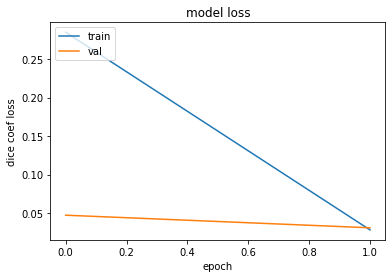

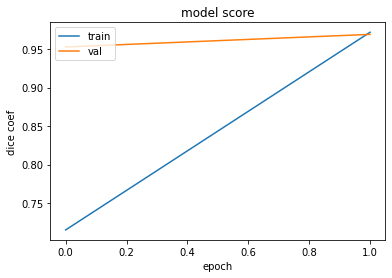

In [ ]:
# summarize history for loss
import matplotlib.pyplot as plt
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('dice coef loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
plt.plot(history.history['dice_coef'])
plt.plot(history.history['val_dice_coef'])
plt.title('model score')
plt.ylabel('dice coef')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
X_test = np.load('/content/drive/My Drive/X_test1.npy')
Y_test = np.load('/content/drive/My Drive/Y_test1.npy')

In [ ]:
Y_pre = np.argmax(model.predict(X_test),axis=-1)

In [ ]:
np.unique(Y_pre)

array([0])

In [ ]:
Y_pre.shape

(1260, 192, 192)

In [ ]:
Y_pre=Y_pre.reshape(-1,192,192,1)

In [ ]:
Y_test.shape,X_test.shape

((1260, 192, 192, 1), (1260, 192, 192, 4))

In [ ]:
for i in range(450,500):
  print('X_test '+ str(i))
  plt.imshow(X_test[i,:,:,2])
  plt.show()
  plt.imshow(Y_pre[i,:,:,0])
  plt.show()
  plt.imshow(Y_test[i,:,:,0])
  plt.show()

In [ ]:
from keras.utils import to_categorical
Y_test_encod = to_categorical(Y_test)

In [ ]:
model.evaluate(X_test,Y_test_encod,verbose=0)

[0.03229586407542229, 0.9677044749259949]

In [ ]:
model.save('/content/drive/My Drive/model.h5',overwrite=True)

In [ ]:
import numpy as np
X_test1 = np.load('/content/drive/My Drive/BraTs2019/TestData/X_test1.npy')
X_test2 = np.load('/content/drive/My Drive/BraTs2019/TestData/X_test2.npy')
X_test3 = np.load('/content/drive/My Drive/BraTs2019/TestData/X_test3.npy')
X_test4 = np.load('/content/drive/My Drive/BraTs2019/TestData/X_test4.npy')

Y_test1 = np.load('/content/drive/My Drive/BraTs2019/TestData/Y_test1.npy')
Y_test2 = np.load('/content/drive/My Drive/BraTs2019/TestData/Y_test2.npy')
Y_test3 = np.load('/content/drive/My Drive/BraTs2019/TestData/Y_test3.npy')
Y_test4 = np.load('/content/drive/My Drive/BraTs2019/TestData/Y_test4.npy')

In [ ]:
np.unique(Y_test1)

array([0, 1, 2, 3], dtype=int16)

In [ ]:
from keras.utils import to_categorical
Y_test_encod1 = to_categorical(Y_test1)
Y_test_encod2 = to_categorical(Y_test2)
Y_test_encod3 = to_categorical(Y_test3)
Y_test_encod4 = to_categorical(Y_test4)

In [ ]:
model.compile(optimizer=Adam(lr=1e-5),loss=[dice_coef_loss],metrics=[dice_coef])

In [ ]:
model.load_weights('/content/drive/My Drive/BraTs2019/weights.hdf5')

In [ ]:
print('HGG Test set no: 1 with Dice Coefficient:- %.4f'%float(list(model.evaluate(X_test1,Y_test_encod1,batch_size=32,verbose=2))[1]))
print('HGG Test set no: 2 with Dice Coefficient:- %.4f'%float(list(model.evaluate(X_test2,Y_test_encod2,batch_size=32,verbose=2))[1]))
print('HGG Test set no: 3 with Dice Coefficient:- %.4f'%float(list(model.evaluate(X_test3,Y_test_encod3,batch_size=32,verbose=2))[1]))
print('LGG Test set no: 4 with Dice Coefficient:- %.4f'%float(list(model.evaluate(X_test4,Y_test_encod4,batch_size=32,verbose=2))[1]))

40/40 - 118s - loss: 0.0323 - dice_coef: 0.9677
HGG Test set no: 1 with Dice Coefficient:- 0.9677
40/40 - 117s - loss: 0.0288 - dice_coef: 0.9712
HGG Test set no: 2 with Dice Coefficient:- 0.9712
40/40 - 116s - loss: 0.0366 - dice_coef: 0.9634
HGG Test set no: 3 with Dice Coefficient:- 0.9634
43/43 - 123s - loss: 0.0360 - dice_coef: 0.9640
LGG Test set no: 4 with Dice Coefficient:- 0.9640


In [ ]:
Y_pred1 = np.argmax(model.predict(X_test1),axis=-1).reshape(-1,192,192,1)
Y_pred2 = np.argmax(model.predict(X_test2),axis=-1).reshape(-1,192,192,1)
Y_pred3 = np.argmax(model.predict(X_test3),axis=-1).reshape(-1,192,192,1)
Y_pred4 = np.argmax(model.predict(X_test4),axis=-1).reshape(-1,192,192,1)

HGG test set no: 1 slice no: 450


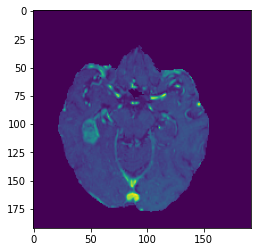

Predicted:- 


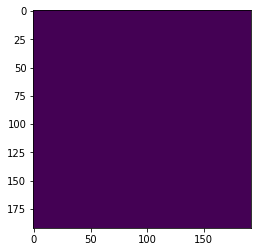

Actual:- 


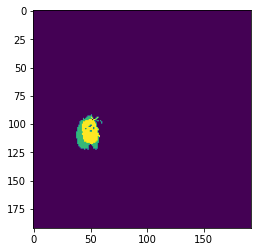

HGG test set no: 1 slice no: 451


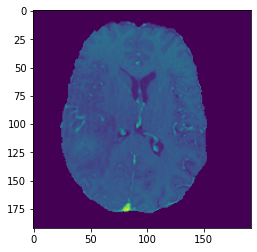

Predicted:- 


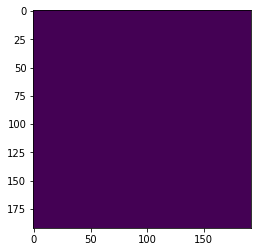

Actual:- 


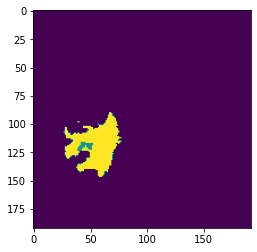

HGG test set no: 1 slice no: 452


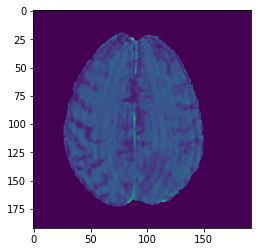

Predicted:- 


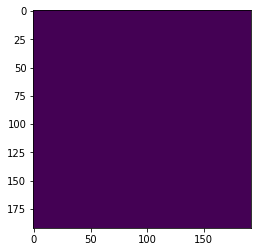

Actual:- 


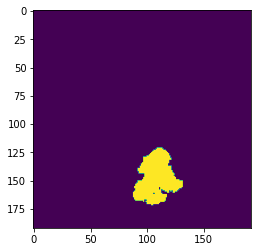

HGG test set no: 1 slice no: 453


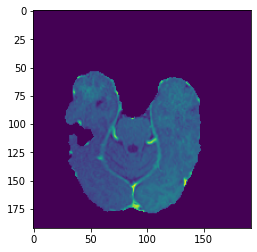

Predicted:- 


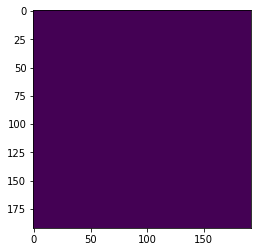

Actual:- 


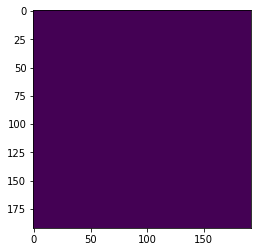

HGG test set no: 1 slice no: 454


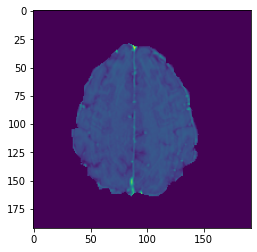

Predicted:- 


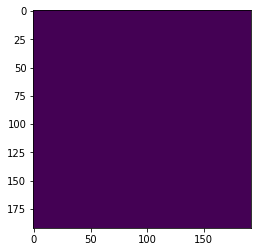

Actual:- 


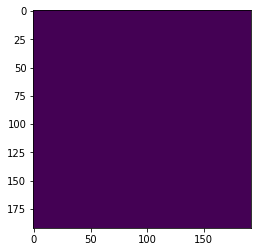

HGG test set no: 1 slice no: 455


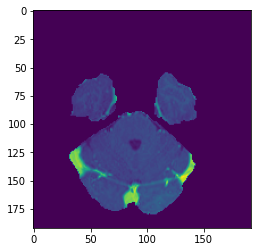

Predicted:- 


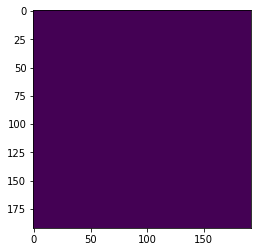

Actual:- 


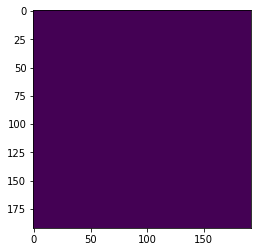

HGG test set no: 1 slice no: 456


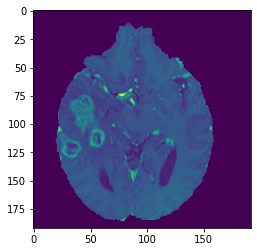

Predicted:- 


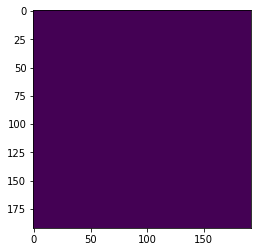

Actual:- 


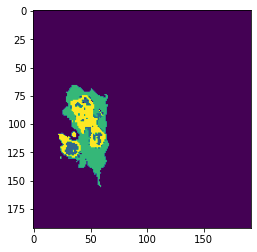

HGG test set no: 1 slice no: 457


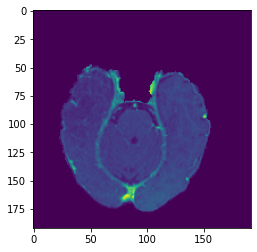

Predicted:- 


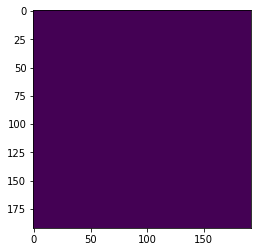

Actual:- 


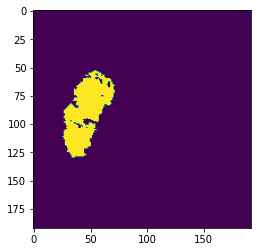

HGG test set no: 1 slice no: 458


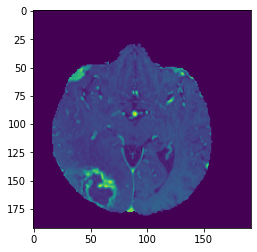

Predicted:- 


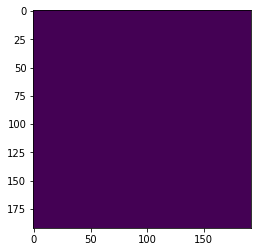

Actual:- 


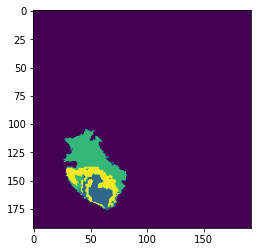

HGG test set no: 1 slice no: 459


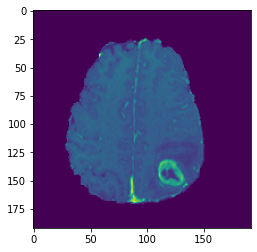

Predicted:- 


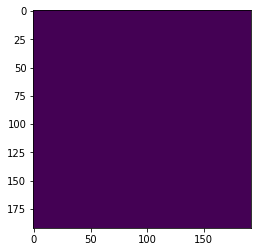

Actual:- 


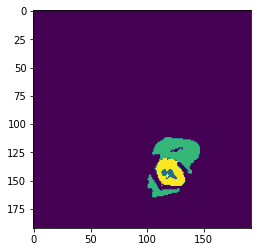

HGG test set no: 1 slice no: 460


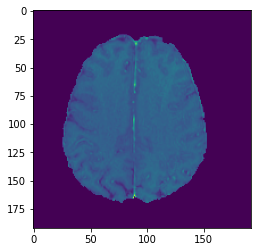

Predicted:- 


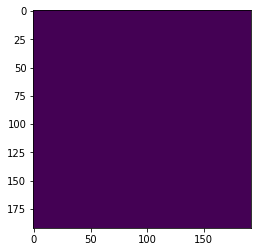

Actual:- 


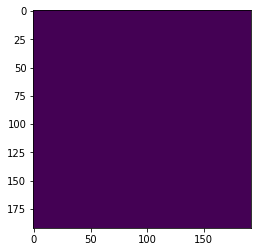

HGG test set no: 1 slice no: 461


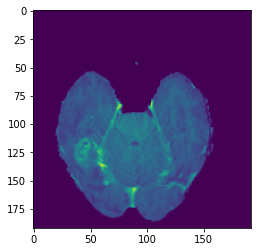

Predicted:- 


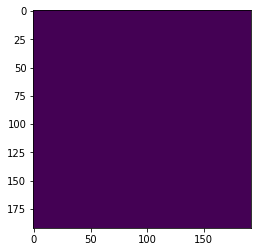

Actual:- 


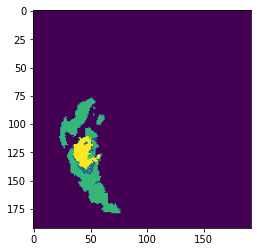

HGG test set no: 1 slice no: 462


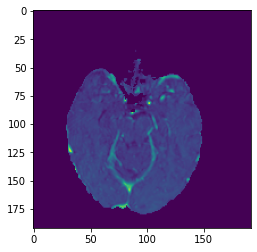

Predicted:- 


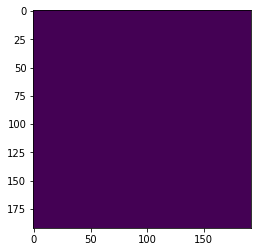

Actual:- 


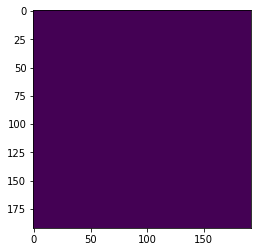

HGG test set no: 1 slice no: 463


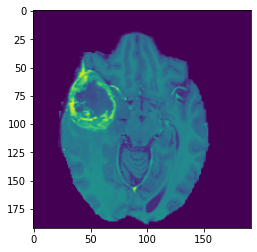

Predicted:- 


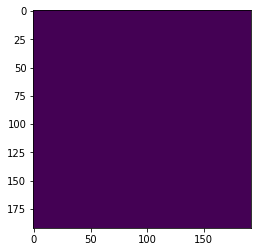

Actual:- 


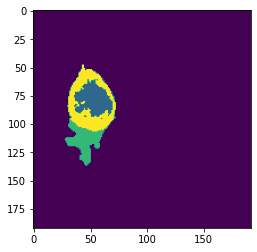

HGG test set no: 1 slice no: 464


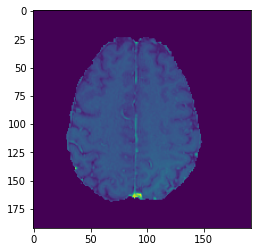

Predicted:- 


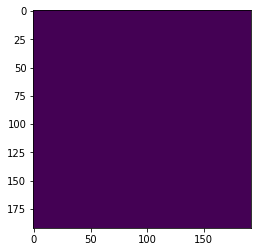

Actual:- 


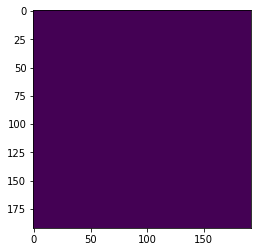

HGG test set no: 1 slice no: 465


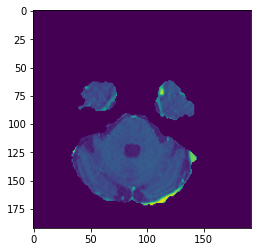

Predicted:- 


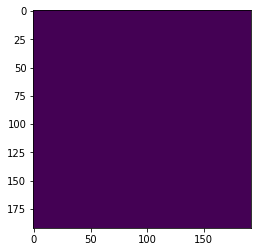

Actual:- 


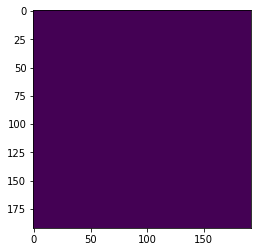

HGG test set no: 1 slice no: 466


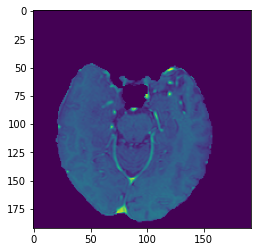

Predicted:- 


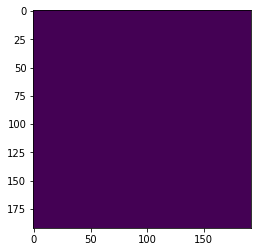

Actual:- 


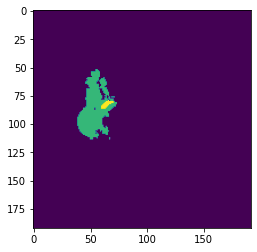

HGG test set no: 1 slice no: 467


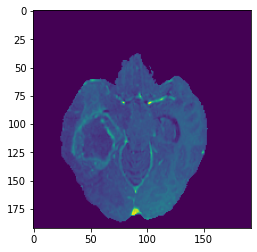

Predicted:- 


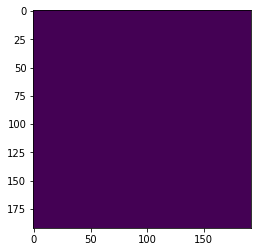

Actual:- 


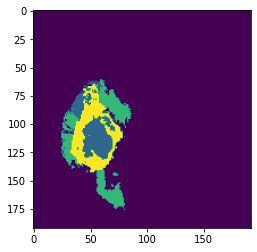

HGG test set no: 1 slice no: 468


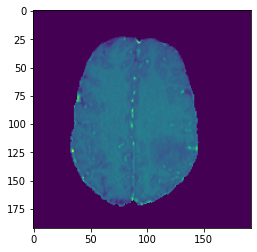

Predicted:- 


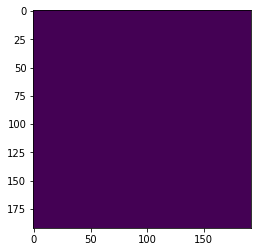

Actual:- 


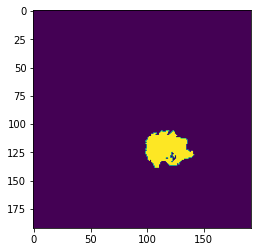

HGG test set no: 1 slice no: 469


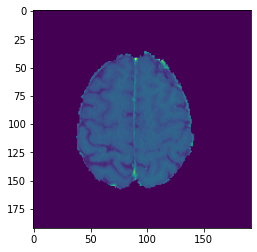

Predicted:- 


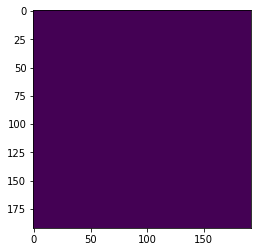

Actual:- 


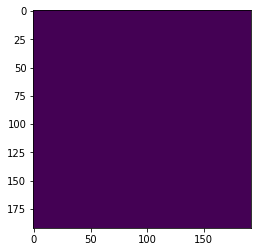

HGG test set no: 1 slice no: 470


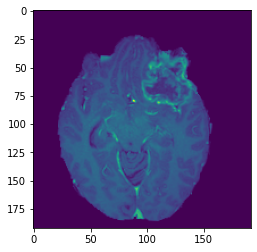

Predicted:- 


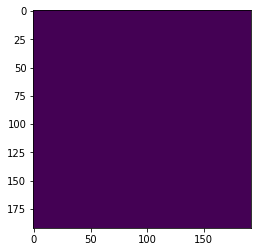

Actual:- 


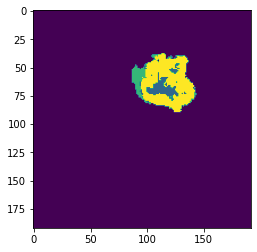

HGG test set no: 1 slice no: 471


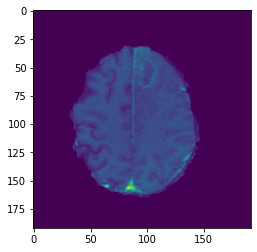

Predicted:- 


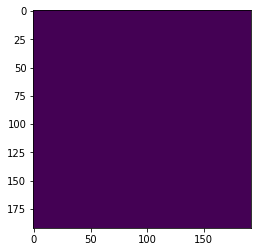

Actual:- 


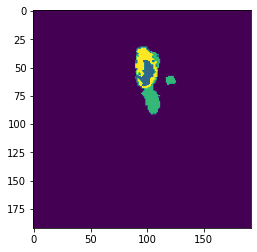

HGG test set no: 1 slice no: 472


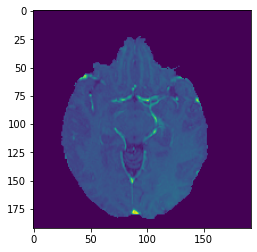

Predicted:- 


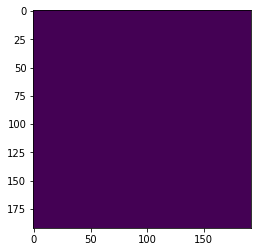

Actual:- 


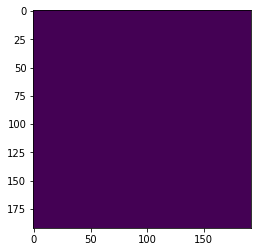

HGG test set no: 1 slice no: 473


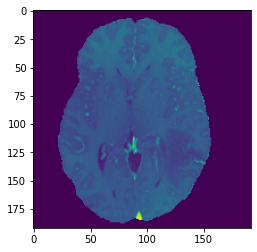

Predicted:- 


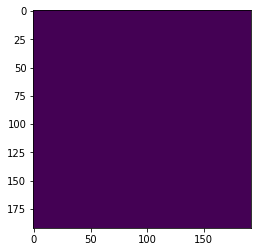

Actual:- 


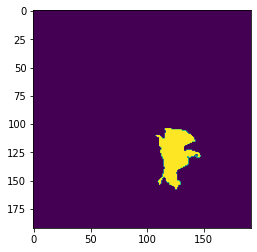

HGG test set no: 1 slice no: 474


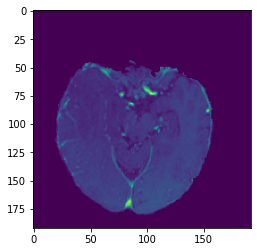

Predicted:- 


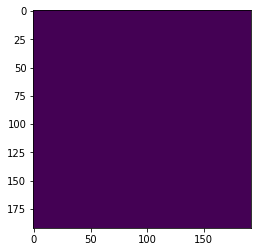

Actual:- 


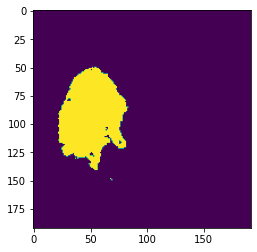

HGG test set no: 1 slice no: 475


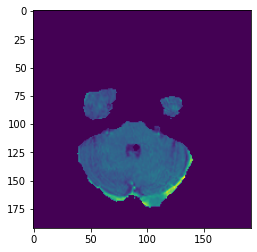

Predicted:- 


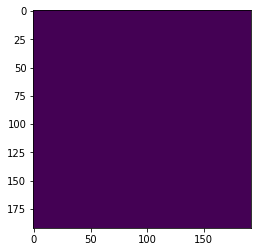

Actual:- 


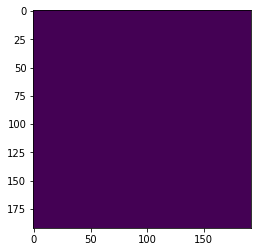

HGG test set no: 1 slice no: 476


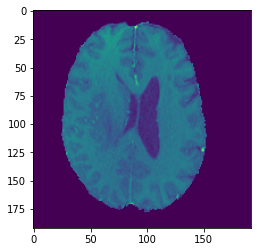

Predicted:- 


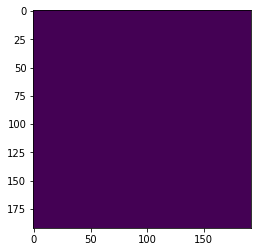

Actual:- 


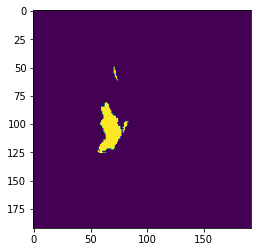

HGG test set no: 1 slice no: 477


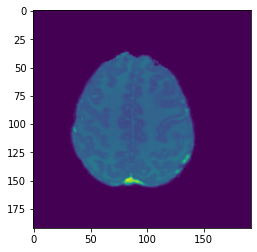

Predicted:- 


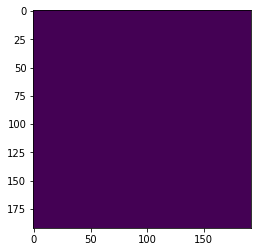

Actual:- 


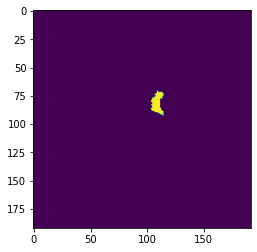

HGG test set no: 1 slice no: 478


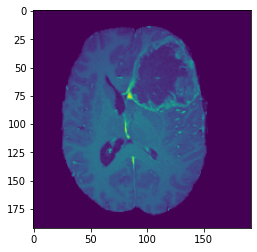

Predicted:- 


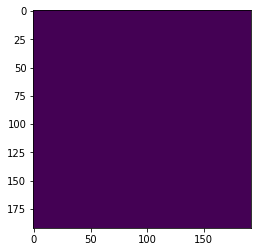

Actual:- 


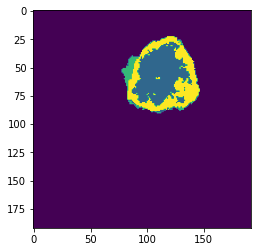

HGG test set no: 1 slice no: 479


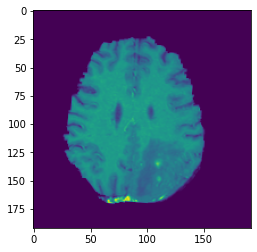

Predicted:- 


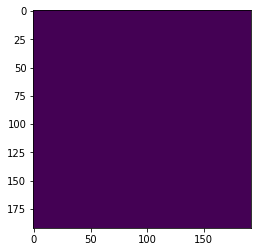

Actual:- 


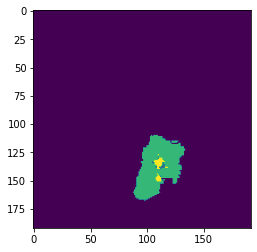

HGG test set no: 1 slice no: 480


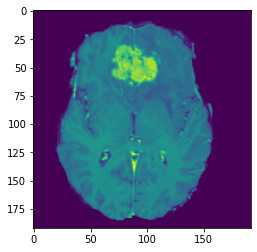

Predicted:- 


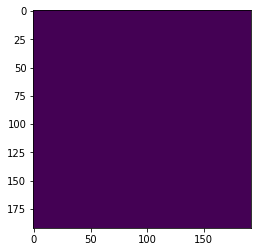

Actual:- 


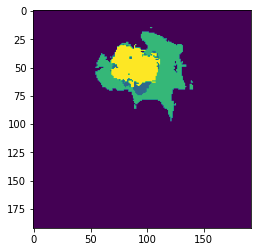

HGG test set no: 1 slice no: 481


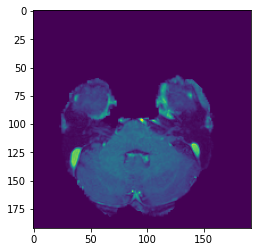

Predicted:- 


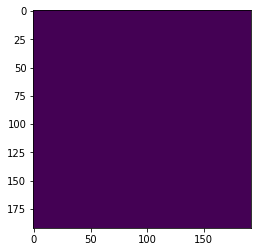

Actual:- 


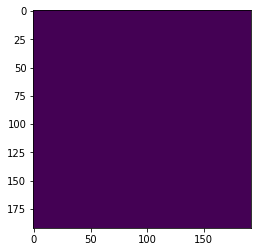

HGG test set no: 1 slice no: 482


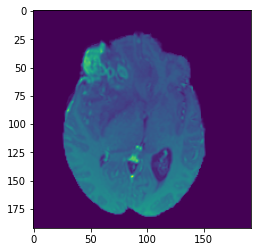

Predicted:- 


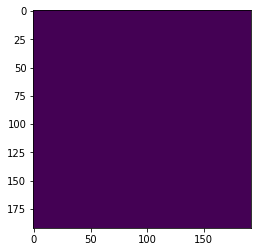

Actual:- 


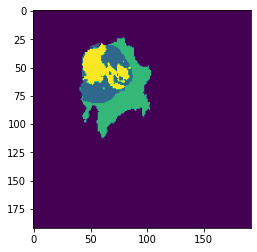

HGG test set no: 1 slice no: 483


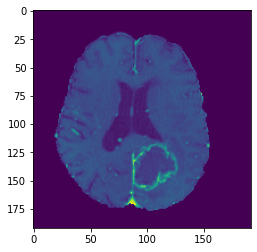

Predicted:- 


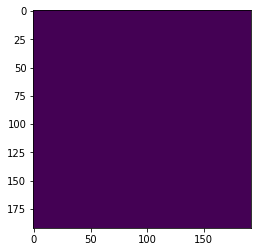

Actual:- 


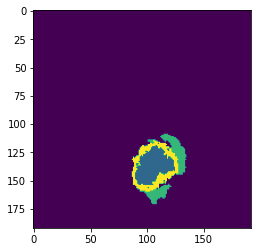

HGG test set no: 1 slice no: 484


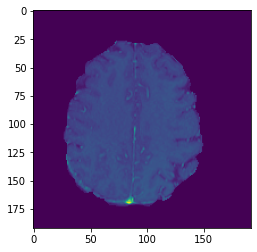

Predicted:- 


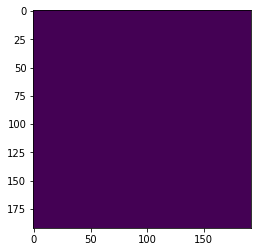

Actual:- 


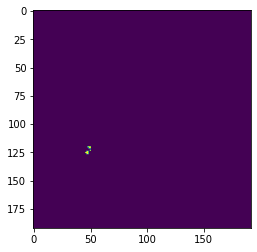

HGG test set no: 1 slice no: 485


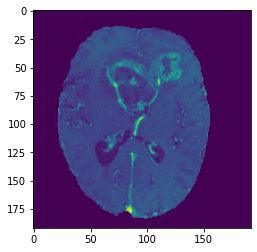

Predicted:- 


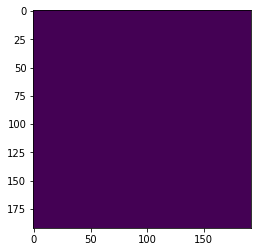

Actual:- 


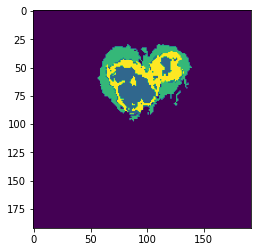

HGG test set no: 1 slice no: 486


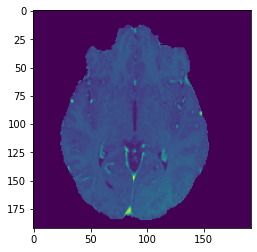

Predicted:- 


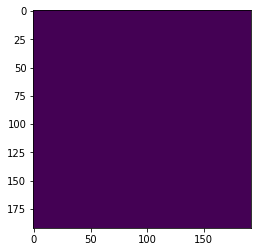

Actual:- 


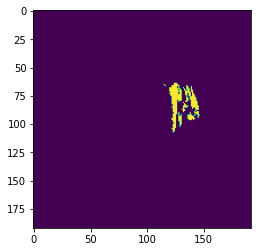

HGG test set no: 1 slice no: 487


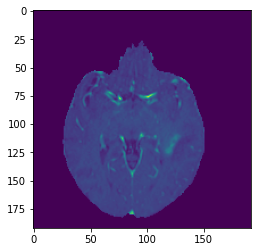

Predicted:- 


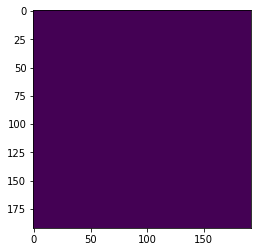

Actual:- 


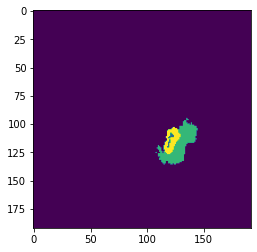

HGG test set no: 1 slice no: 488


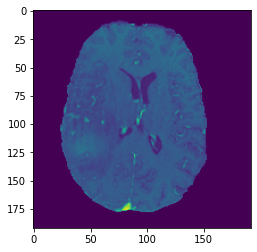

Predicted:- 


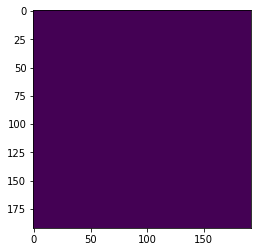

Actual:- 


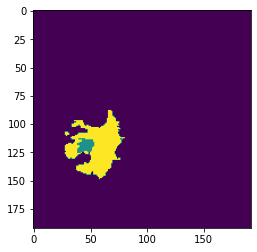

HGG test set no: 1 slice no: 489


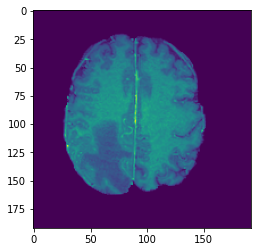

Predicted:- 


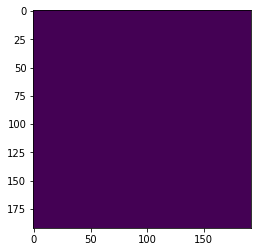

Actual:- 


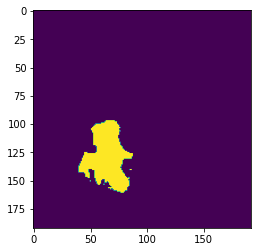

HGG test set no: 1 slice no: 490


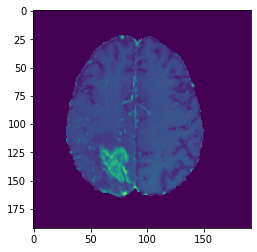

Predicted:- 


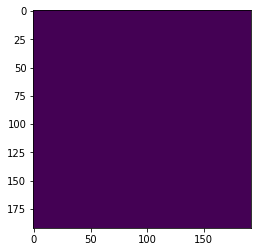

Actual:- 


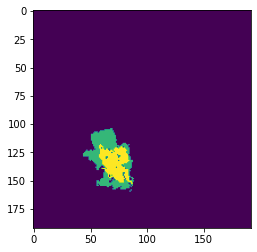

HGG test set no: 1 slice no: 491


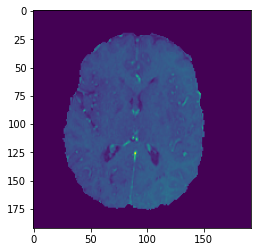

Predicted:- 


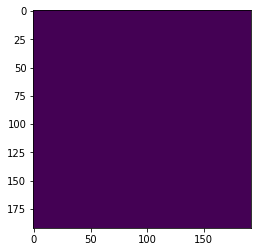

Actual:- 


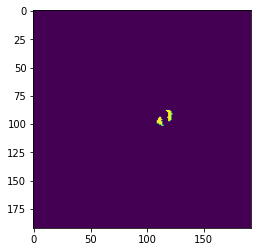

HGG test set no: 1 slice no: 492


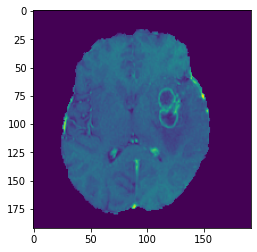

Predicted:- 


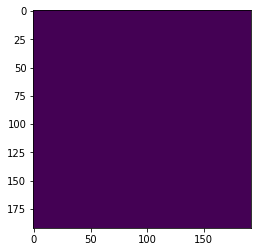

Actual:- 


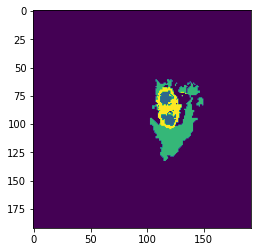

HGG test set no: 1 slice no: 493


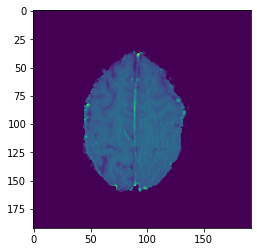

Predicted:- 


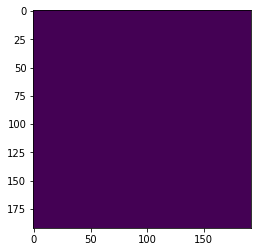

Actual:- 


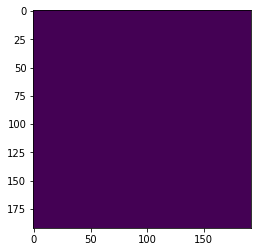

HGG test set no: 1 slice no: 494


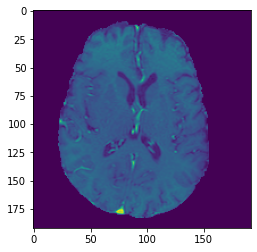

Predicted:- 


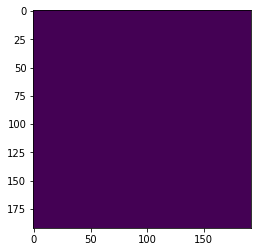

Actual:- 


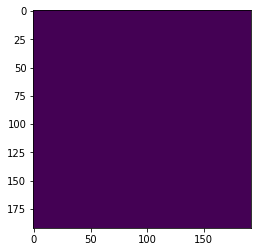

HGG test set no: 1 slice no: 495


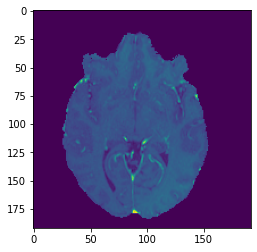

Predicted:- 


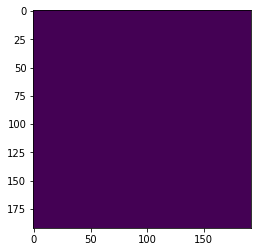

Actual:- 


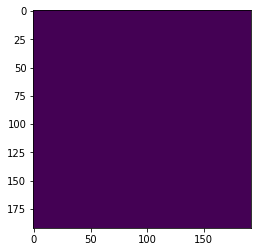

HGG test set no: 1 slice no: 496


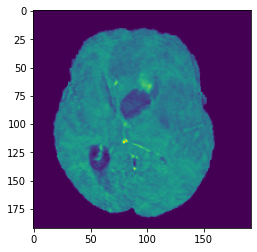

Predicted:- 


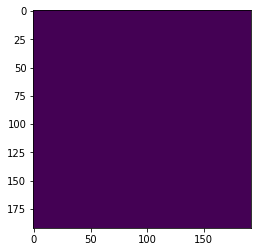

Actual:- 


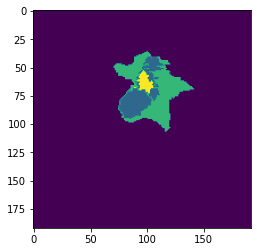

HGG test set no: 1 slice no: 497


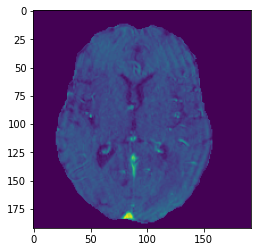

Predicted:- 


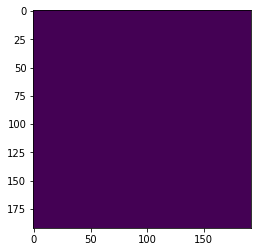

Actual:- 


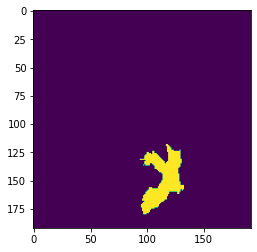

HGG test set no: 1 slice no: 498


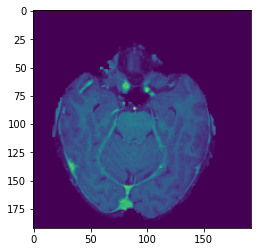

Predicted:- 


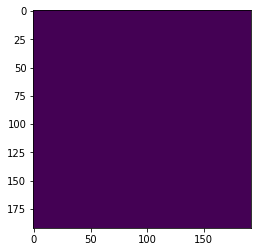

Actual:- 


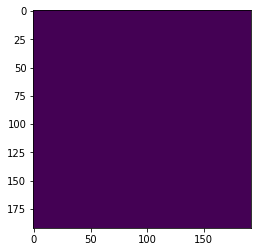

HGG test set no: 1 slice no: 499


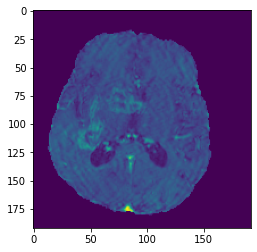

Predicted:- 


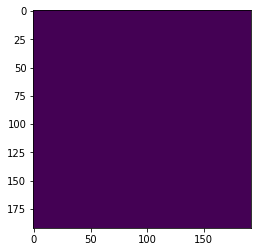

Actual:- 


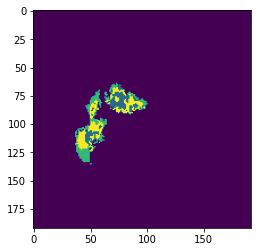

HGG test set no: 2 slice no: 450


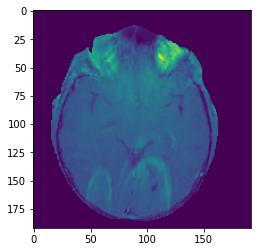

Predicted:- 


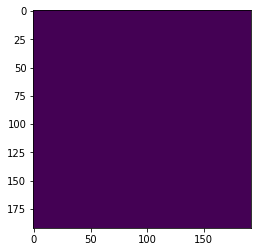

Actual:- 


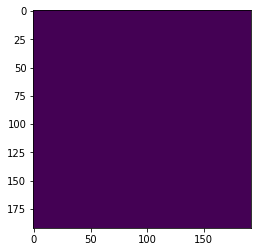

HGG test set no: 2 slice no: 451


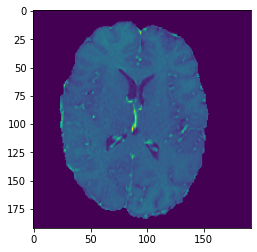

Predicted:- 


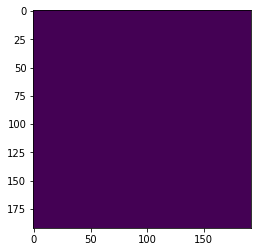

Actual:- 


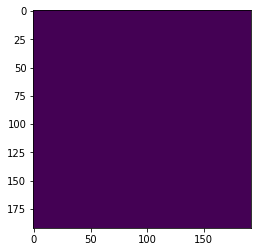

HGG test set no: 2 slice no: 452


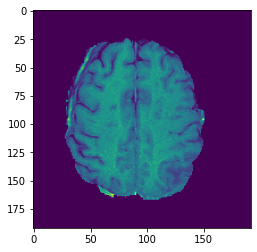

Predicted:- 


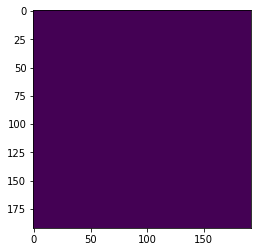

Actual:- 


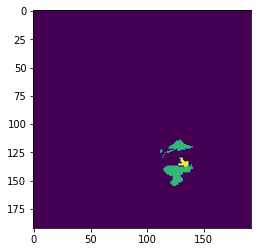

HGG test set no: 2 slice no: 453


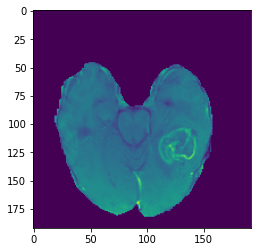

Predicted:- 


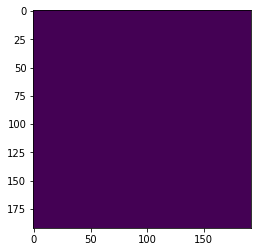

Actual:- 


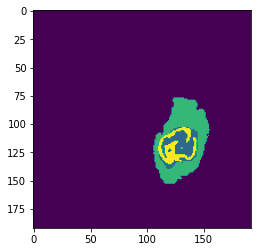

HGG test set no: 2 slice no: 454


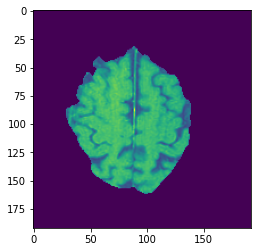

Predicted:- 


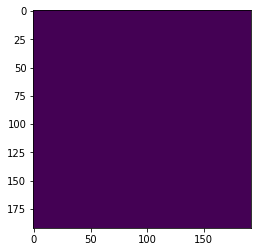

Actual:- 


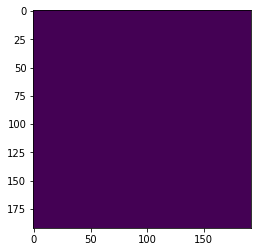

HGG test set no: 2 slice no: 455


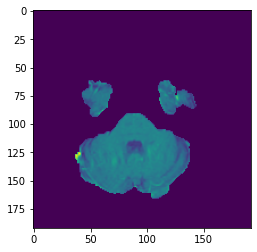

Predicted:- 


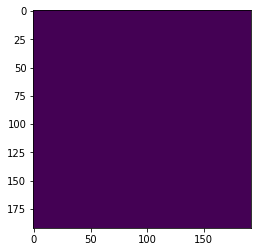

Actual:- 


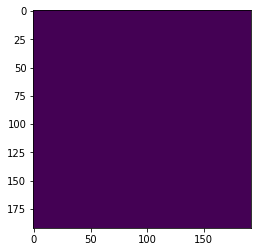

HGG test set no: 2 slice no: 456


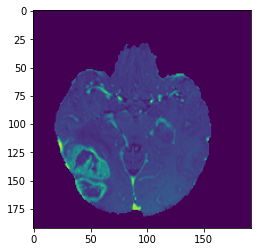

Predicted:- 


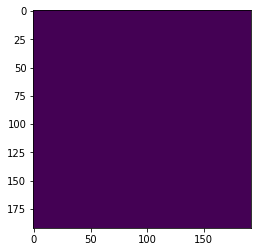

Actual:- 


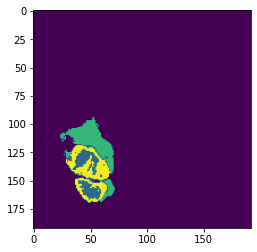

HGG test set no: 2 slice no: 457


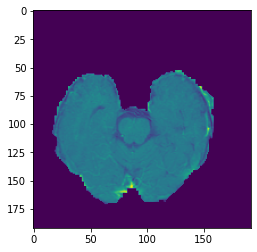

Predicted:- 


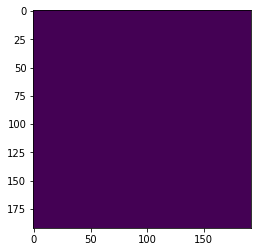

Actual:- 


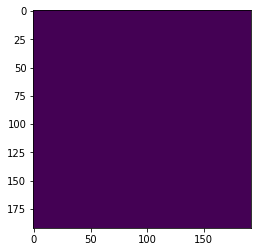

HGG test set no: 2 slice no: 458


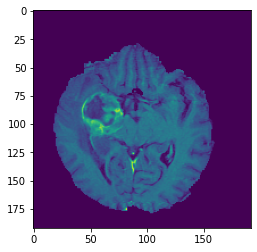

Predicted:- 


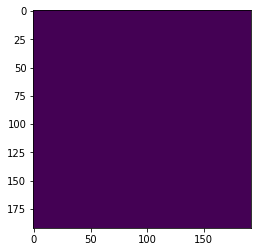

Actual:- 


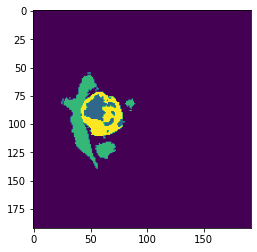

HGG test set no: 2 slice no: 459


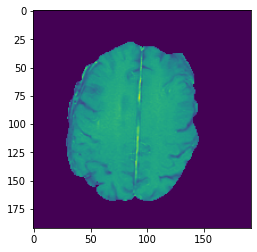

Predicted:- 


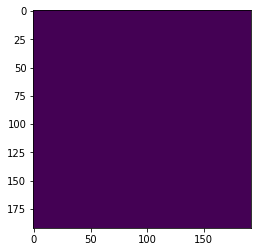

Actual:- 


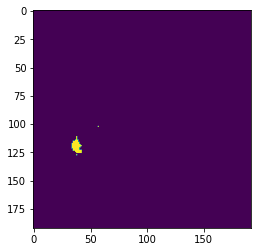

HGG test set no: 2 slice no: 460


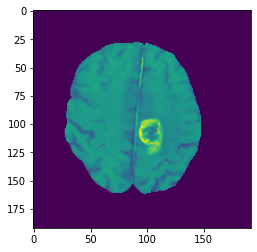

Predicted:- 


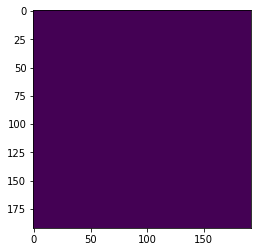

Actual:- 


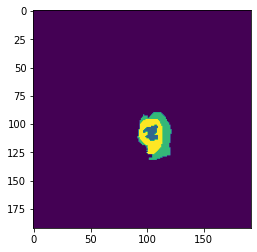

HGG test set no: 2 slice no: 461


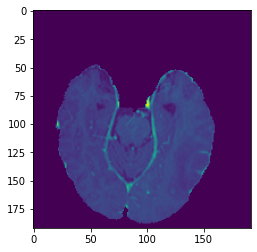

Predicted:- 


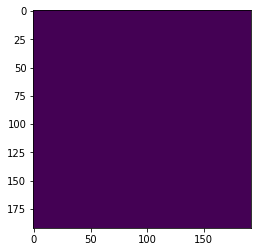

Actual:- 


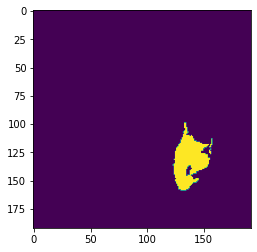

HGG test set no: 2 slice no: 462


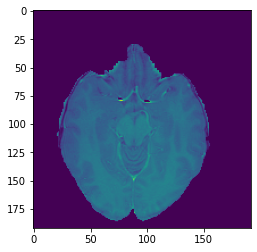

Predicted:- 


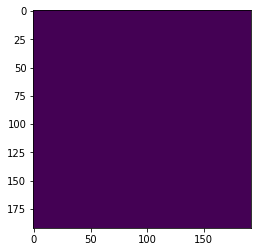

Actual:- 


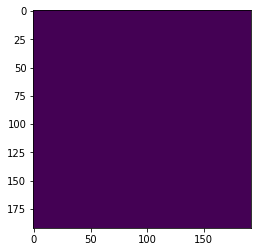

HGG test set no: 2 slice no: 463


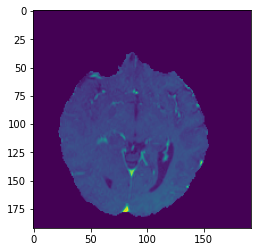

Predicted:- 


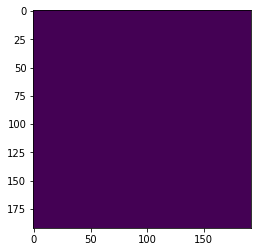

Actual:- 


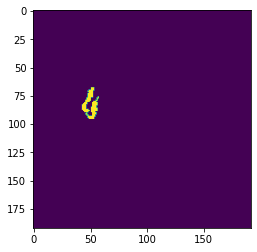

HGG test set no: 2 slice no: 464


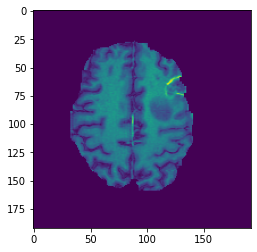

Predicted:- 


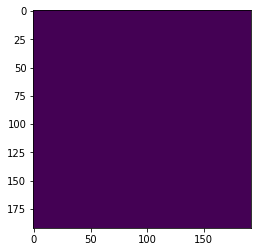

Actual:- 


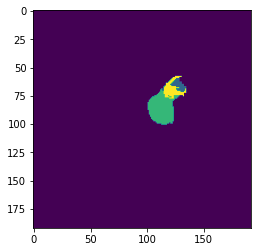

HGG test set no: 2 slice no: 465


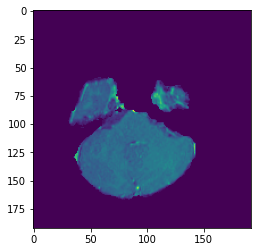

Predicted:- 


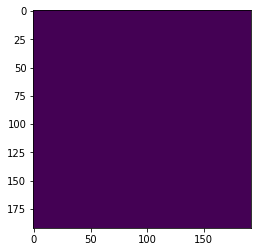

Actual:- 


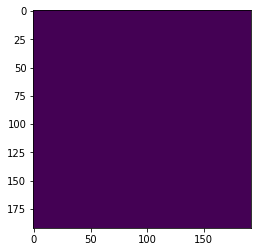

HGG test set no: 2 slice no: 466


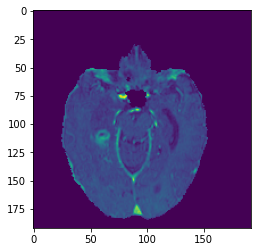

Predicted:- 


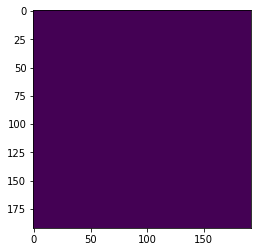

Actual:- 


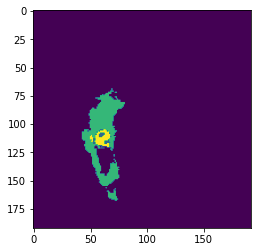

HGG test set no: 2 slice no: 467


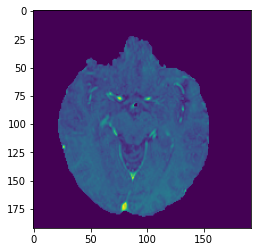

Predicted:- 


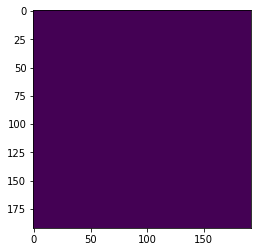

Actual:- 


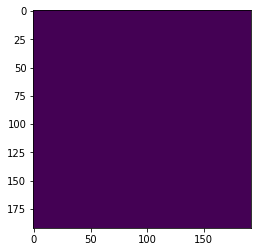

HGG test set no: 2 slice no: 468


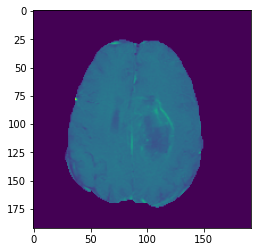

Predicted:- 


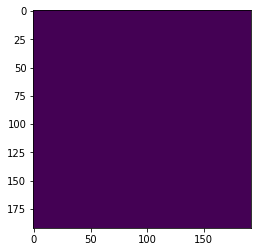

Actual:- 


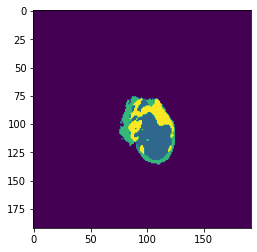

HGG test set no: 2 slice no: 469


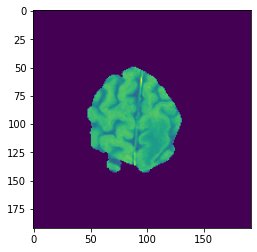

Predicted:- 


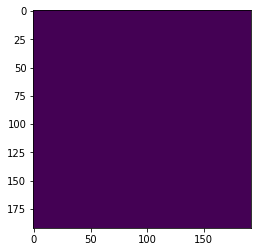

Actual:- 


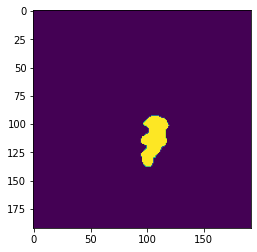

HGG test set no: 2 slice no: 470


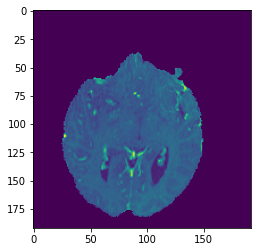

Predicted:- 


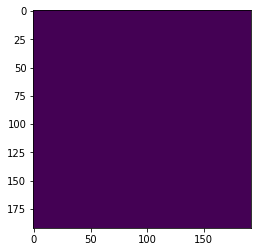

Actual:- 


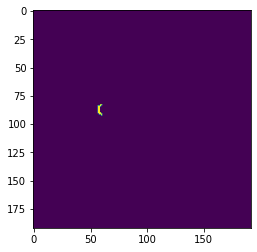

HGG test set no: 2 slice no: 471


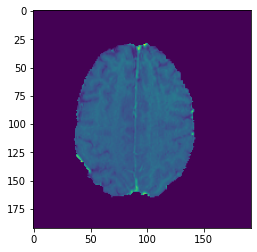

Predicted:- 


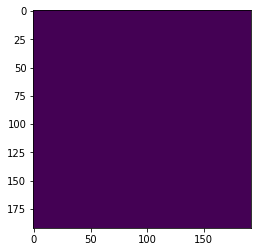

Actual:- 


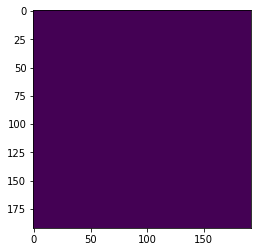

HGG test set no: 2 slice no: 472


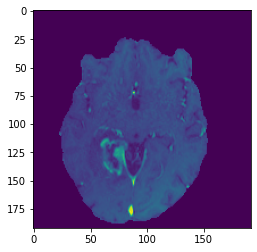

Predicted:- 


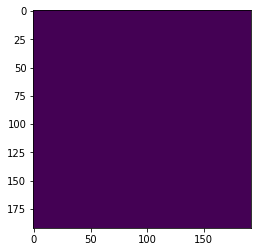

Actual:- 


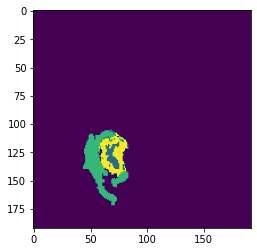

HGG test set no: 2 slice no: 473


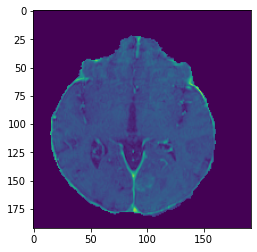

Predicted:- 


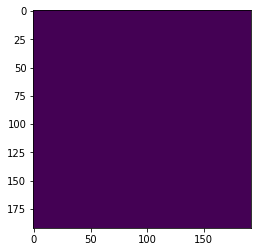

Actual:- 


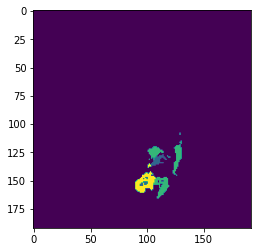

HGG test set no: 2 slice no: 474


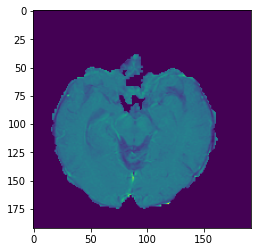

Predicted:- 


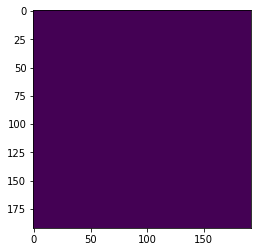

Actual:- 


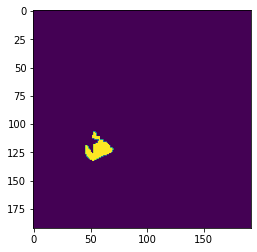

HGG test set no: 2 slice no: 475


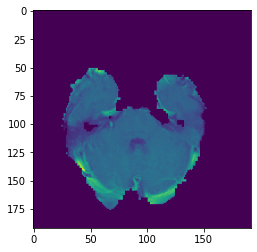

Predicted:- 


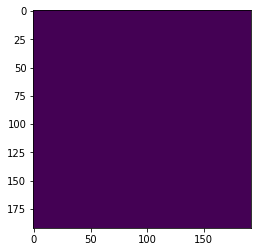

Actual:- 


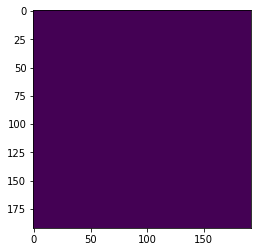

HGG test set no: 2 slice no: 476


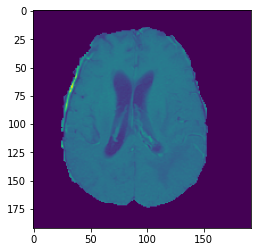

Predicted:- 


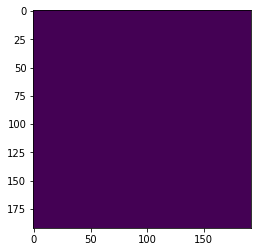

Actual:- 


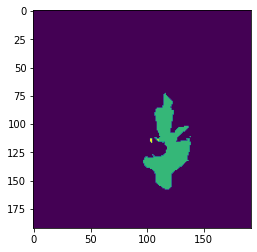

HGG test set no: 2 slice no: 477


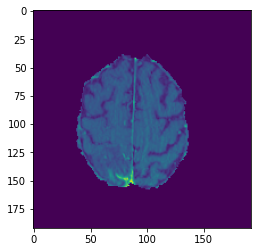

Predicted:- 


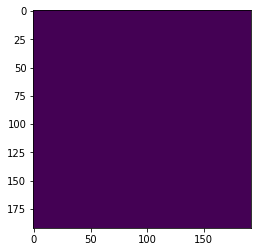

Actual:- 


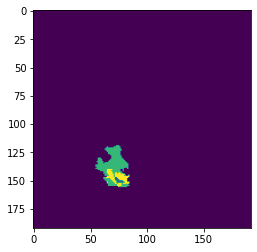

HGG test set no: 2 slice no: 478


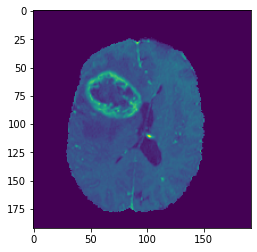

Predicted:- 


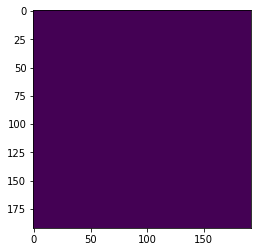

Actual:- 


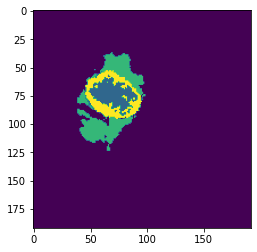

HGG test set no: 2 slice no: 479


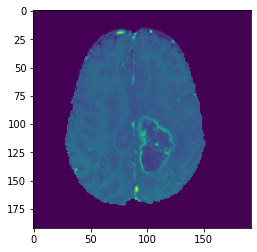

Predicted:- 


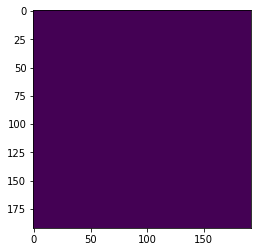

Actual:- 


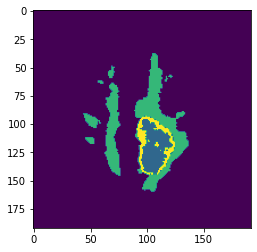

HGG test set no: 2 slice no: 480


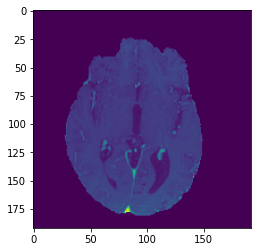

Predicted:- 


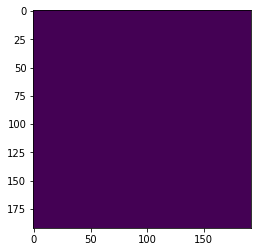

Actual:- 


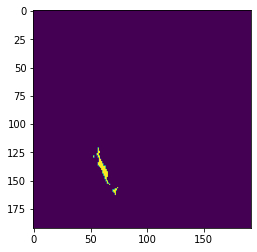

HGG test set no: 2 slice no: 481


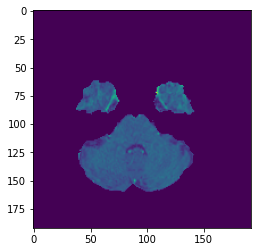

Predicted:- 


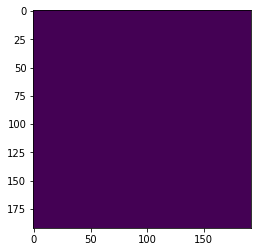

Actual:- 


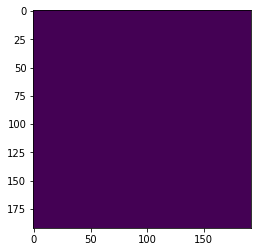

HGG test set no: 2 slice no: 482


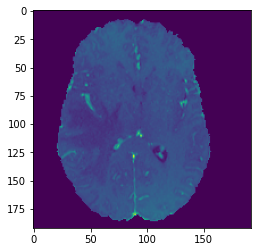

Predicted:- 


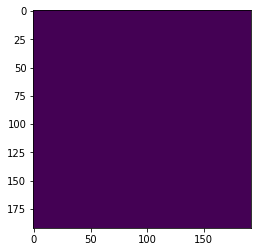

Actual:- 


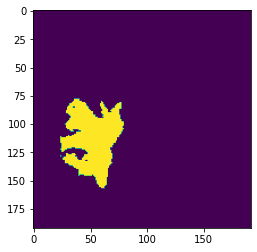

HGG test set no: 2 slice no: 483


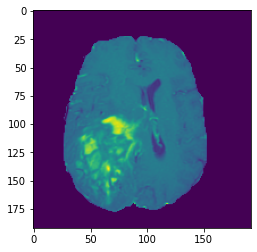

Predicted:- 


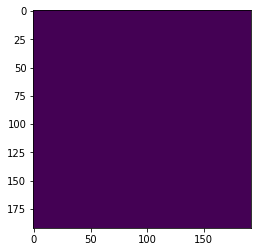

Actual:- 


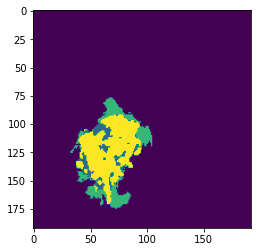

HGG test set no: 2 slice no: 484


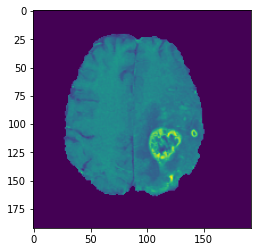

Predicted:- 


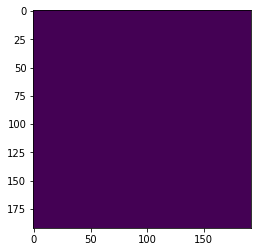

Actual:- 


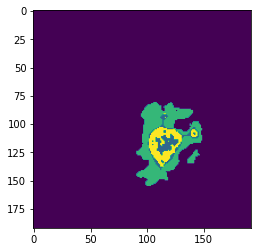

HGG test set no: 2 slice no: 485


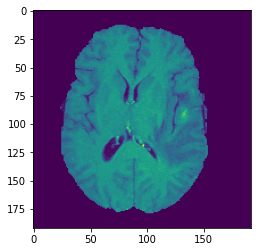

Predicted:- 


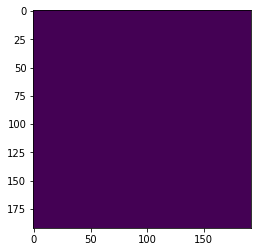

Actual:- 


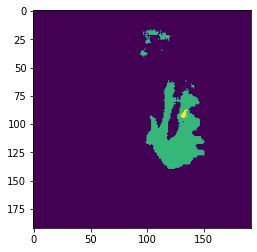

HGG test set no: 2 slice no: 486


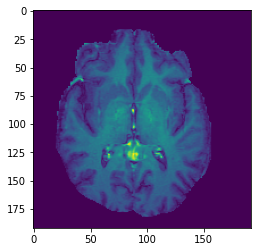

Predicted:- 


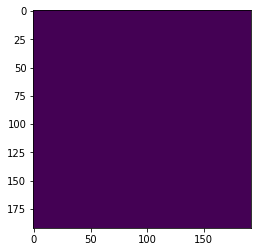

Actual:- 


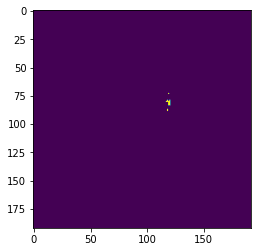

HGG test set no: 2 slice no: 487


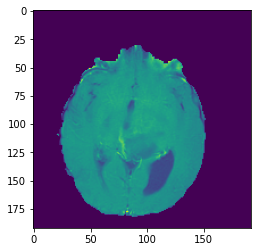

Predicted:- 


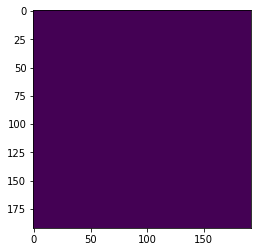

Actual:- 


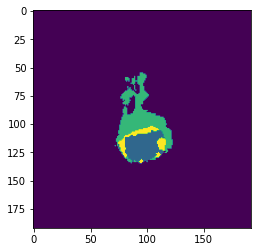

HGG test set no: 2 slice no: 488


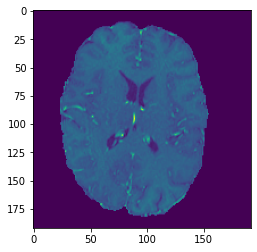

Predicted:- 


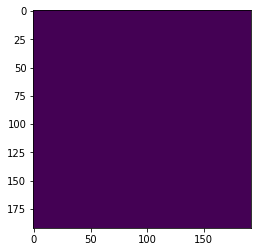

Actual:- 


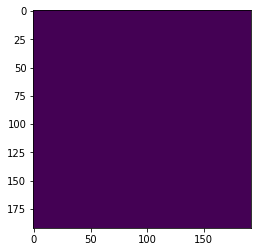

HGG test set no: 2 slice no: 489


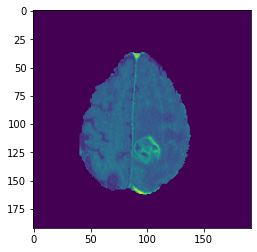

Predicted:- 


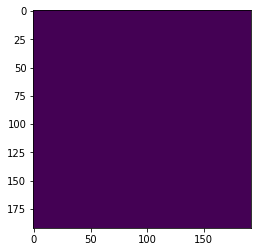

Actual:- 


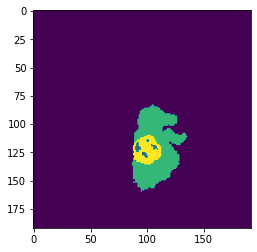

HGG test set no: 2 slice no: 490


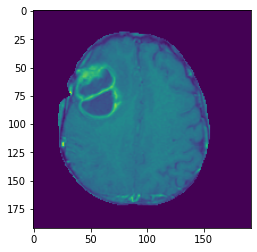

Predicted:- 


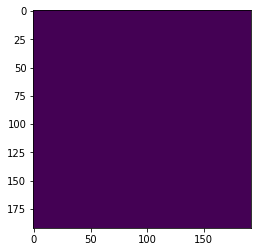

Actual:- 


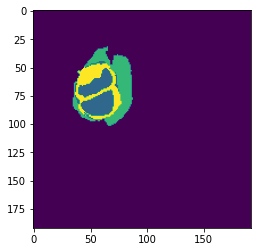

HGG test set no: 2 slice no: 491


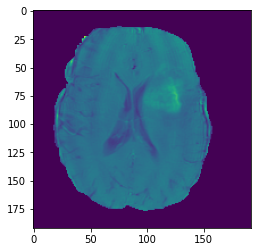

Predicted:- 


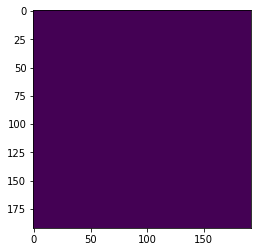

Actual:- 


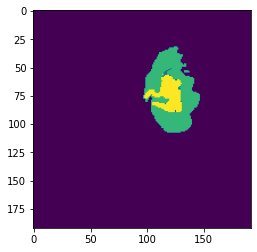

HGG test set no: 2 slice no: 492


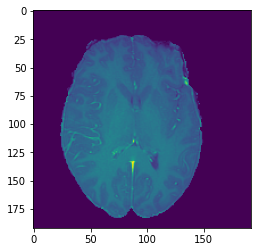

Predicted:- 


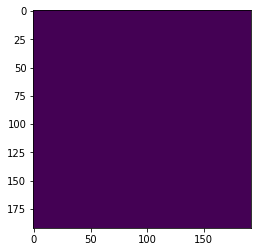

Actual:- 


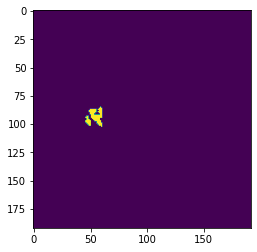

HGG test set no: 2 slice no: 493


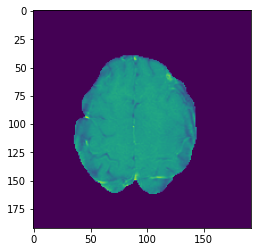

Predicted:- 


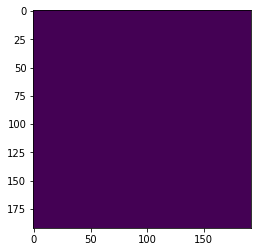

Actual:- 


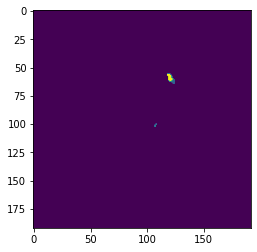

HGG test set no: 2 slice no: 494


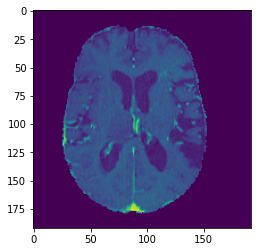

Predicted:- 


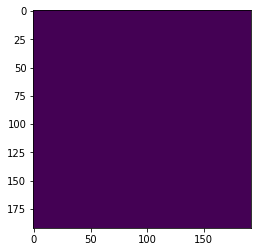

Actual:- 


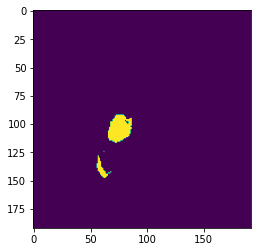

HGG test set no: 2 slice no: 495


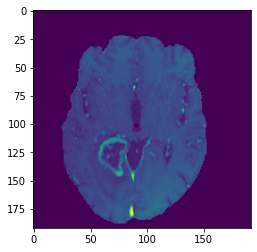

Predicted:- 


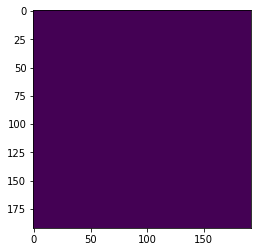

Actual:- 


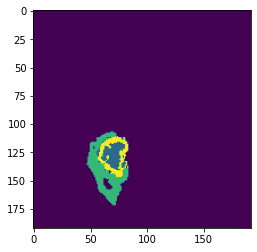

HGG test set no: 2 slice no: 496


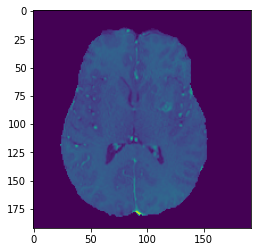

Predicted:- 


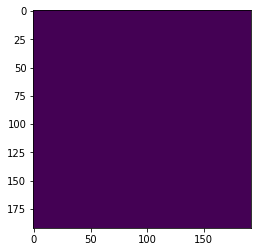

Actual:- 


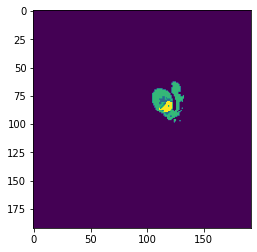

HGG test set no: 2 slice no: 497


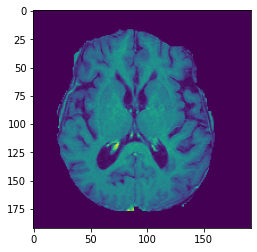

Predicted:- 


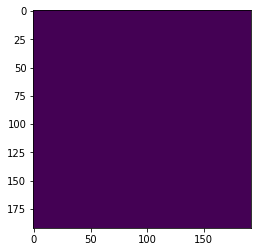

Actual:- 


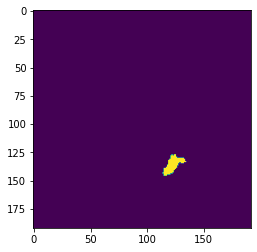

HGG test set no: 2 slice no: 498


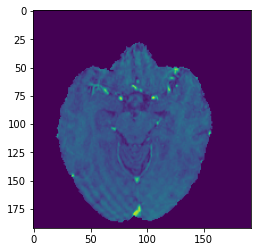

Predicted:- 


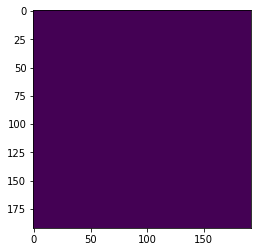

Actual:- 


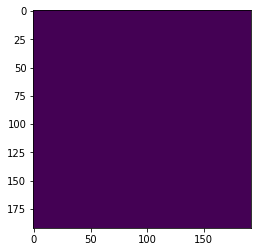

HGG test set no: 2 slice no: 499


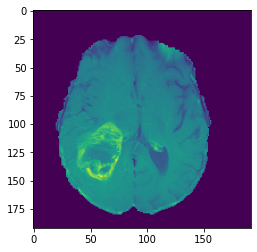

Predicted:- 


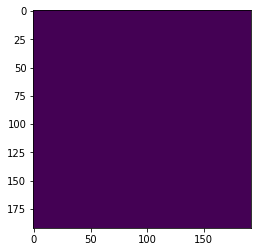

Actual:- 


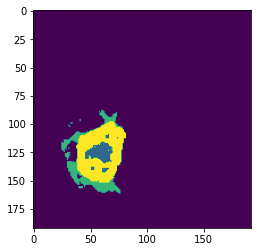

HGG test set no: 3 slice no: 450


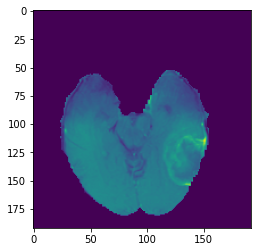

Predicted:- 


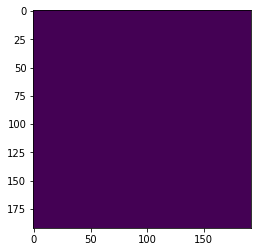

Actual:- 


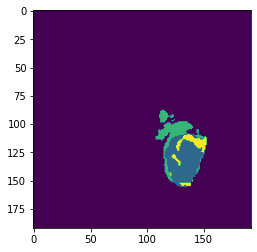

HGG test set no: 3 slice no: 451


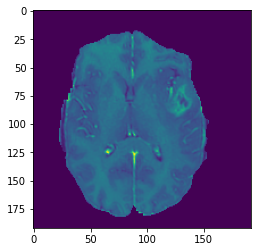

Predicted:- 


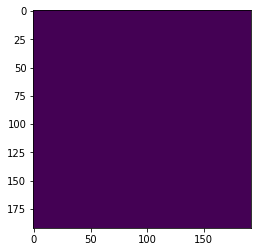

Actual:- 


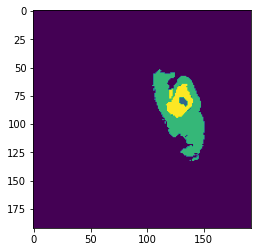

HGG test set no: 3 slice no: 452


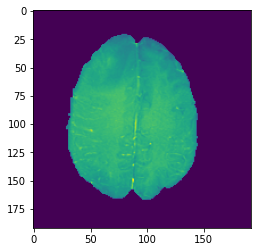

Predicted:- 


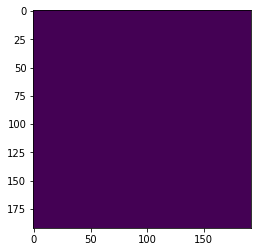

Actual:- 


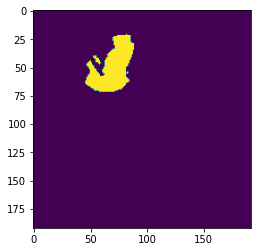

HGG test set no: 3 slice no: 453


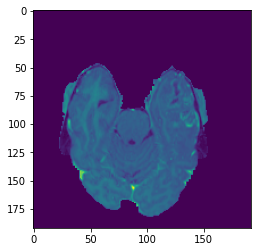

Predicted:- 


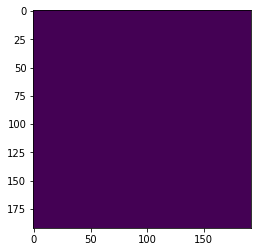

Actual:- 


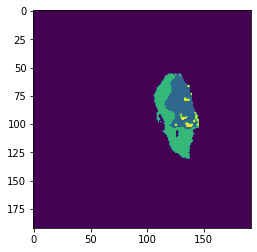

HGG test set no: 3 slice no: 454


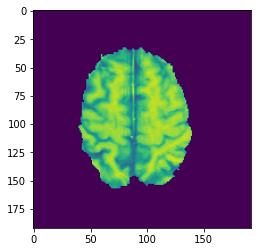

Predicted:- 


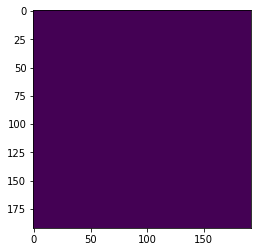

Actual:- 


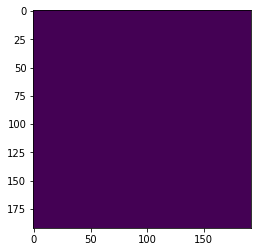

HGG test set no: 3 slice no: 455


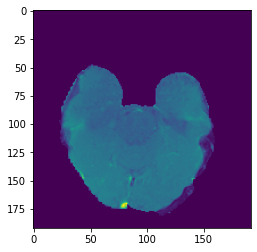

Predicted:- 


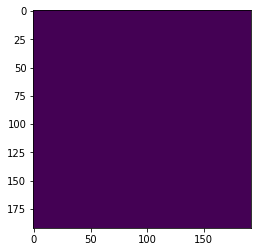

Actual:- 


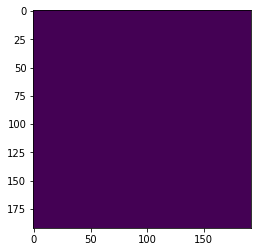

HGG test set no: 3 slice no: 456


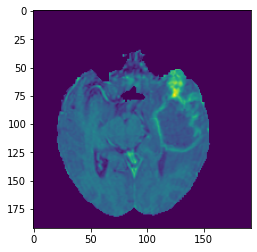

Predicted:- 


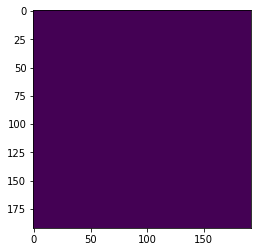

Actual:- 


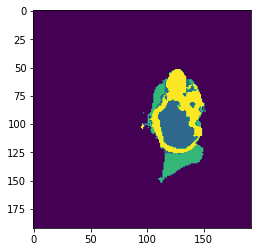

HGG test set no: 3 slice no: 457


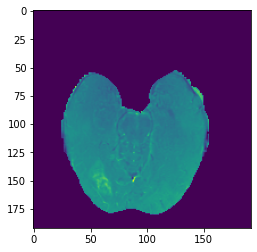

Predicted:- 


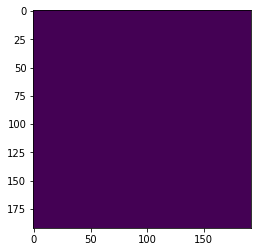

Actual:- 


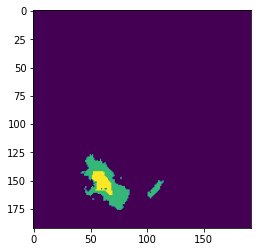

HGG test set no: 3 slice no: 458


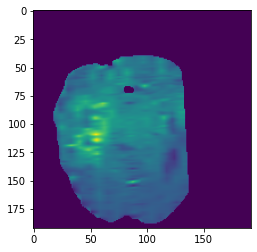

Predicted:- 


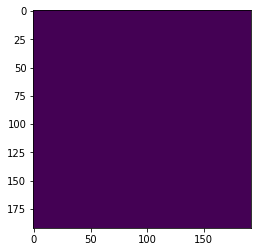

Actual:- 


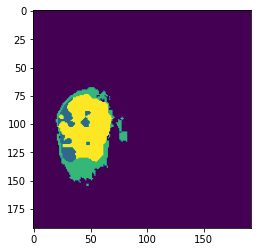

HGG test set no: 3 slice no: 459


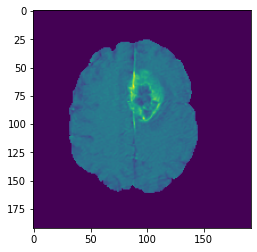

Predicted:- 


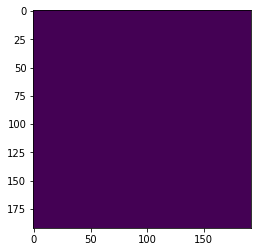

Actual:- 


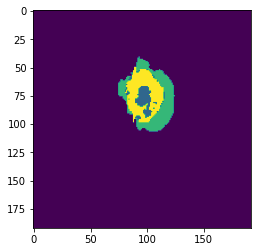

HGG test set no: 3 slice no: 460


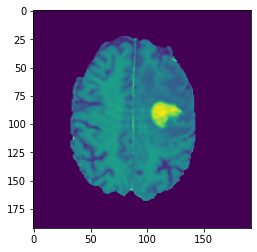

Predicted:- 


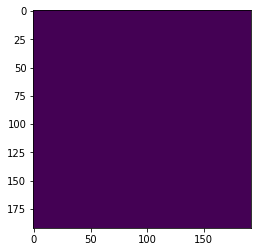

Actual:- 


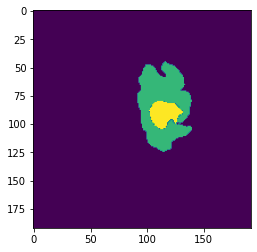

HGG test set no: 3 slice no: 461


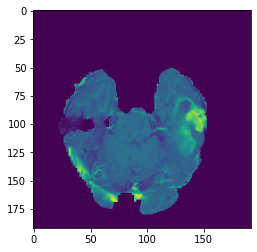

Predicted:- 


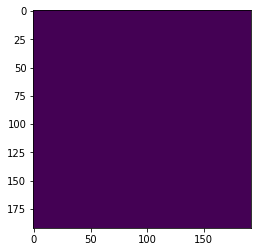

Actual:- 


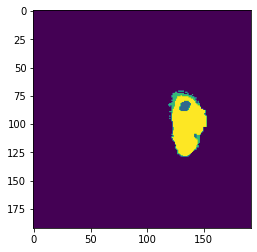

HGG test set no: 3 slice no: 462


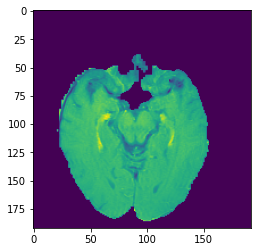

Predicted:- 


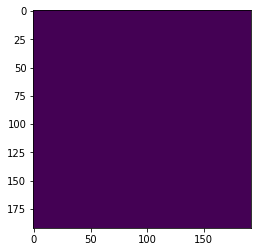

Actual:- 


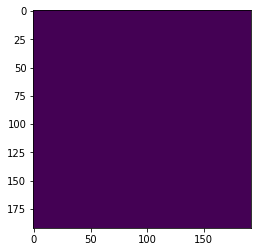

HGG test set no: 3 slice no: 463


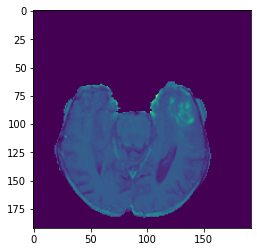

Predicted:- 


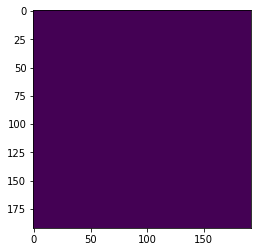

Actual:- 


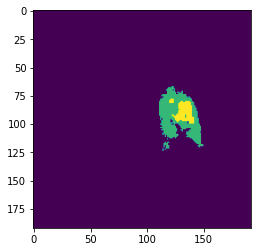

HGG test set no: 3 slice no: 464


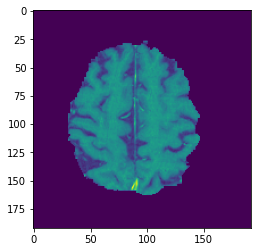

Predicted:- 


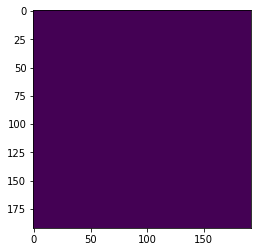

Actual:- 


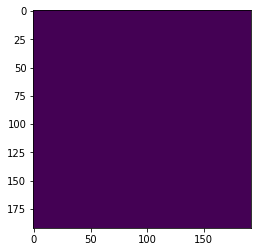

HGG test set no: 3 slice no: 465


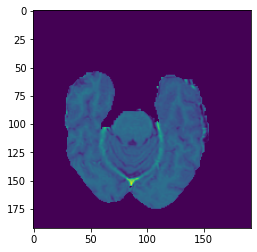

Predicted:- 


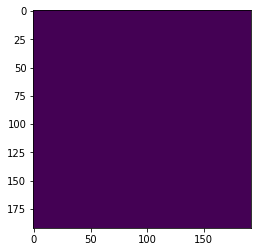

Actual:- 


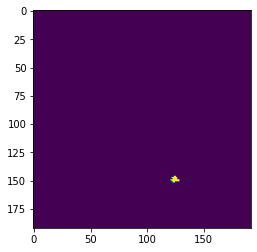

HGG test set no: 3 slice no: 466


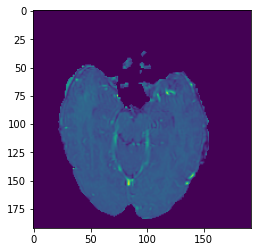

Predicted:- 


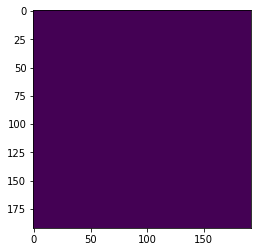

Actual:- 


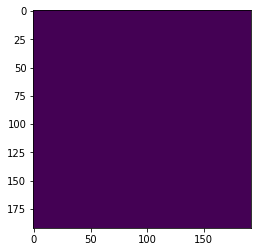

HGG test set no: 3 slice no: 467


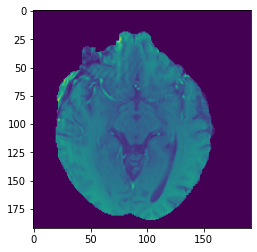

Predicted:- 


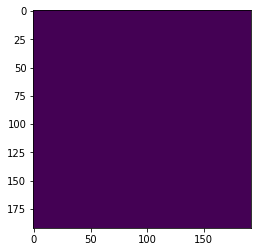

Actual:- 


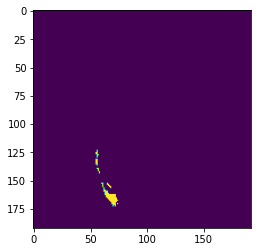

HGG test set no: 3 slice no: 468


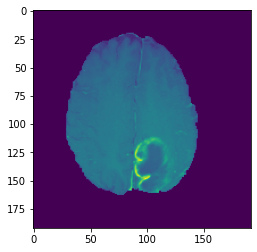

Predicted:- 


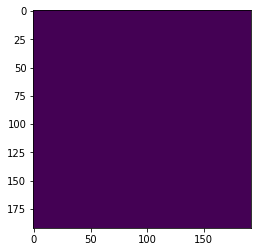

Actual:- 


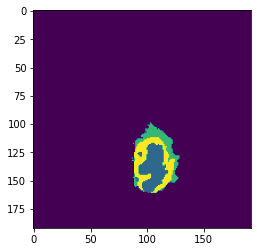

HGG test set no: 3 slice no: 469


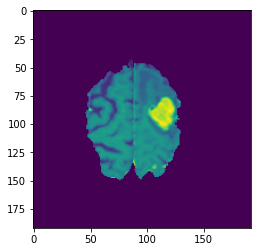

Predicted:- 


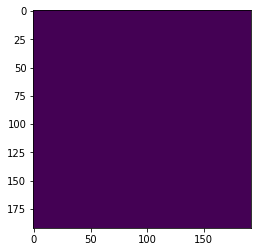

Actual:- 


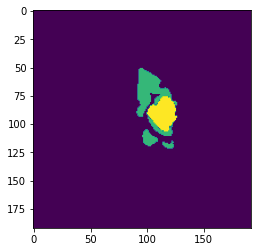

HGG test set no: 3 slice no: 470


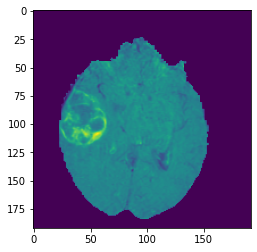

Predicted:- 


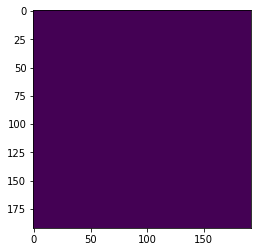

Actual:- 


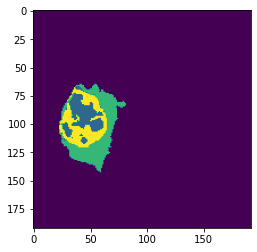

HGG test set no: 3 slice no: 471


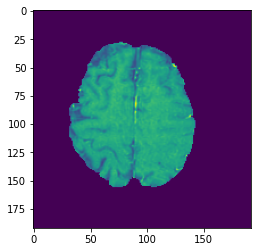

Predicted:- 


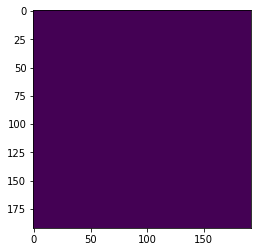

Actual:- 


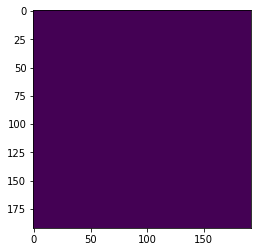

HGG test set no: 3 slice no: 472


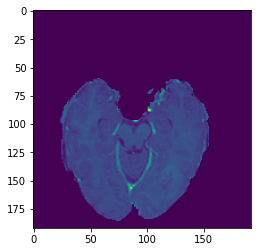

Predicted:- 


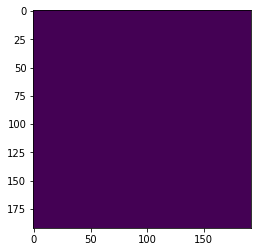

Actual:- 


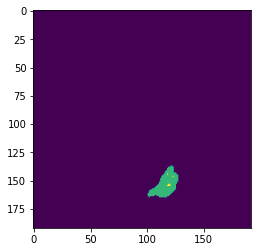

HGG test set no: 3 slice no: 473


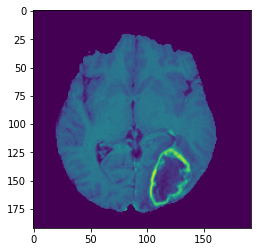

Predicted:- 


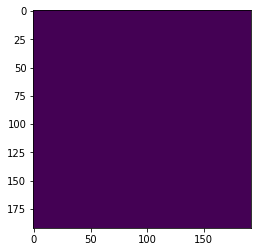

Actual:- 


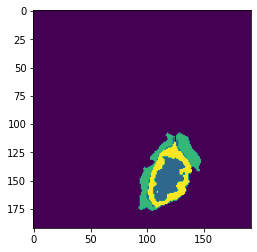

HGG test set no: 3 slice no: 474


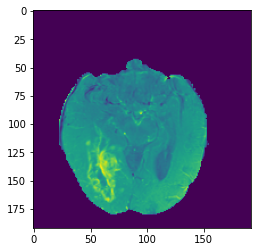

Predicted:- 


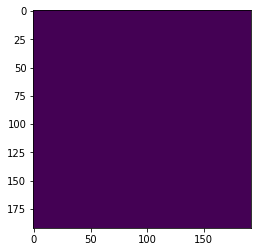

Actual:- 


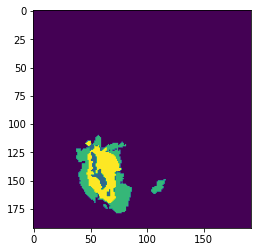

HGG test set no: 3 slice no: 475


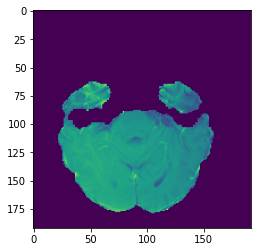

Predicted:- 


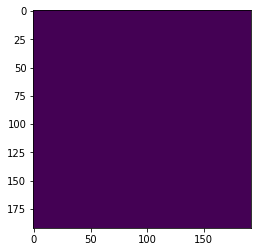

Actual:- 


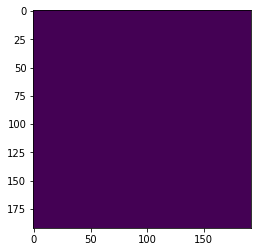

HGG test set no: 3 slice no: 476


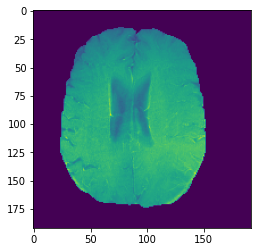

Predicted:- 


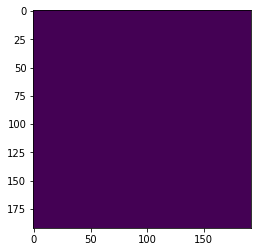

Actual:- 


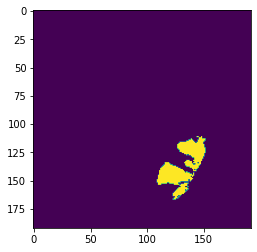

HGG test set no: 3 slice no: 477


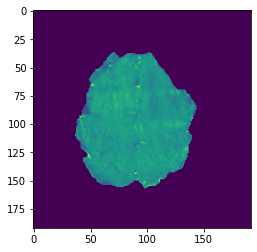

Predicted:- 


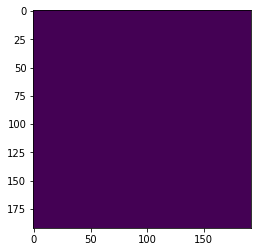

Actual:- 


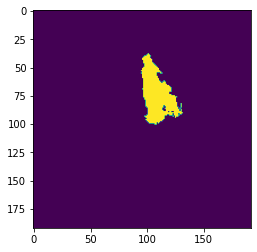

HGG test set no: 3 slice no: 478


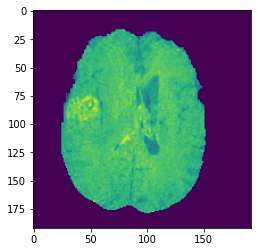

Predicted:- 


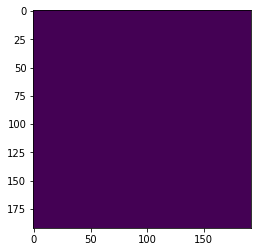

Actual:- 


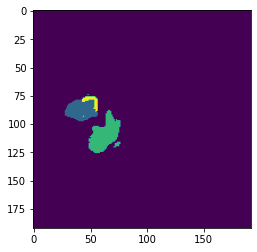

HGG test set no: 3 slice no: 479


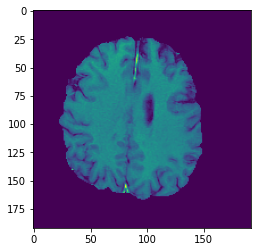

Predicted:- 


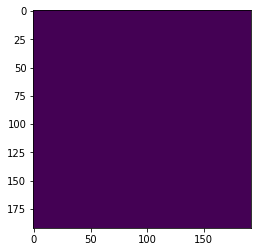

Actual:- 


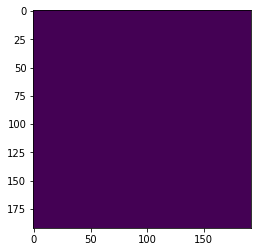

HGG test set no: 3 slice no: 480


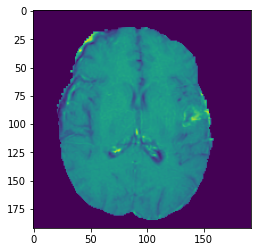

Predicted:- 


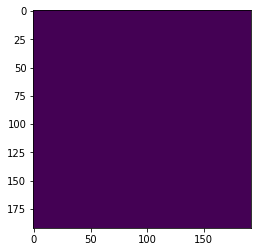

Actual:- 


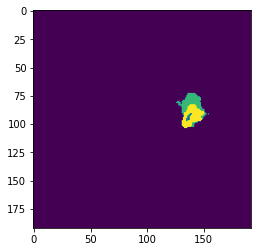

HGG test set no: 3 slice no: 481


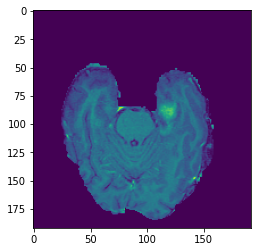

Predicted:- 


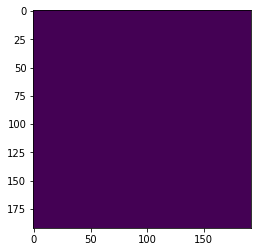

Actual:- 


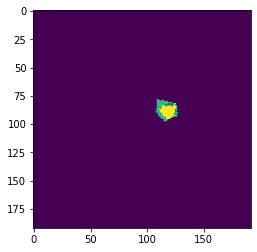

HGG test set no: 3 slice no: 482


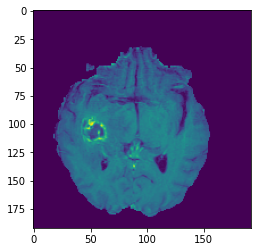

Predicted:- 


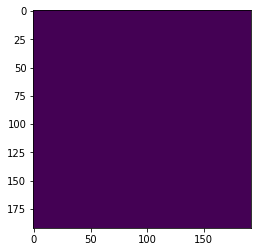

Actual:- 


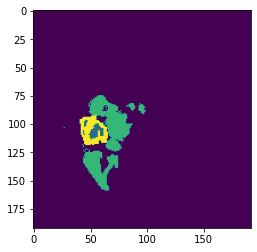

HGG test set no: 3 slice no: 483


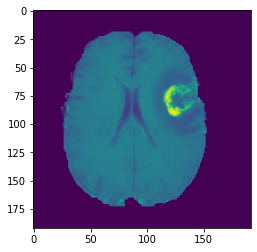

Predicted:- 


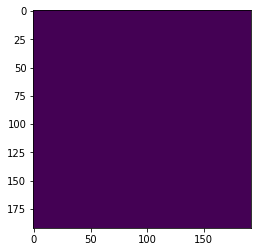

Actual:- 


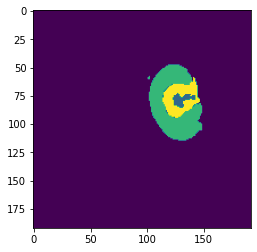

HGG test set no: 3 slice no: 484


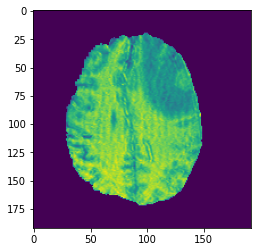

Predicted:- 


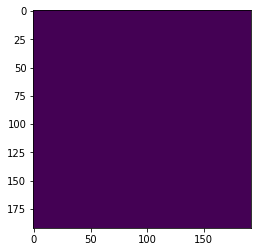

Actual:- 


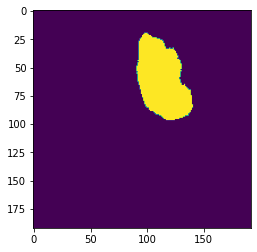

HGG test set no: 3 slice no: 485


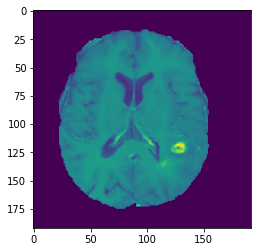

Predicted:- 


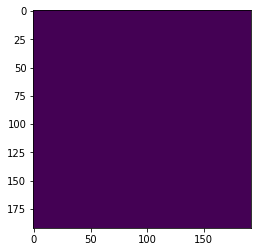

Actual:- 


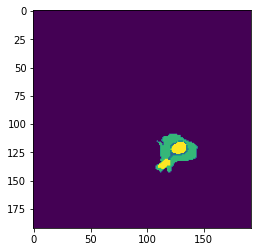

HGG test set no: 3 slice no: 486


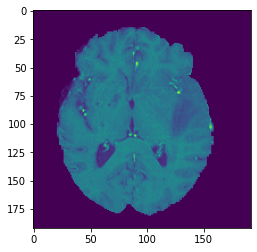

Predicted:- 


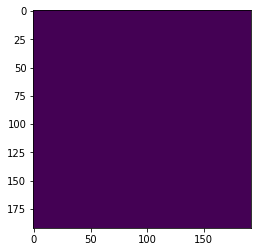

Actual:- 


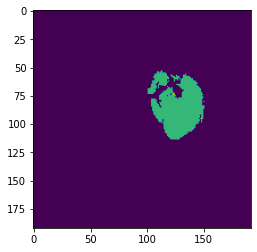

HGG test set no: 3 slice no: 487


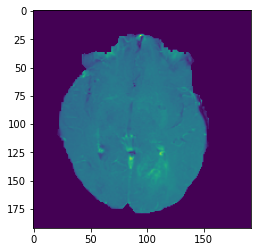

Predicted:- 


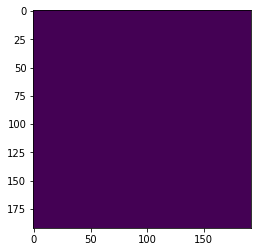

Actual:- 


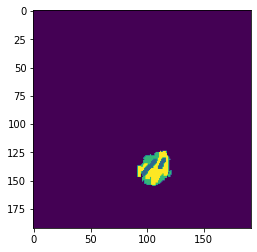

HGG test set no: 3 slice no: 488


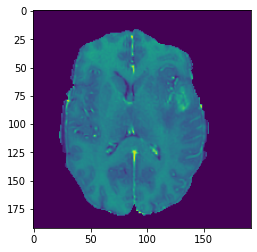

Predicted:- 


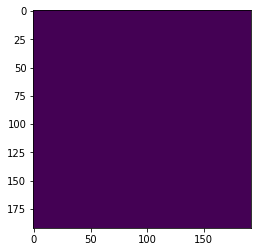

Actual:- 


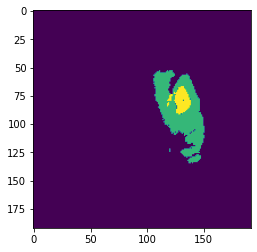

HGG test set no: 3 slice no: 489


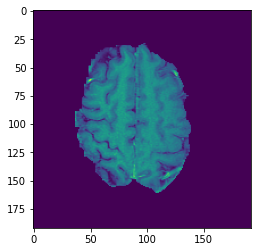

Predicted:- 


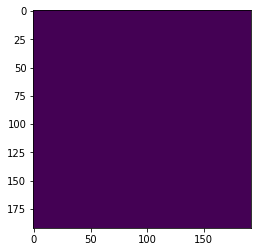

Actual:- 


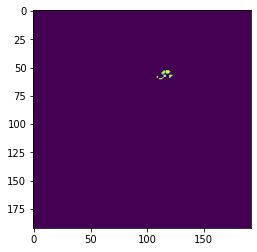

HGG test set no: 3 slice no: 490


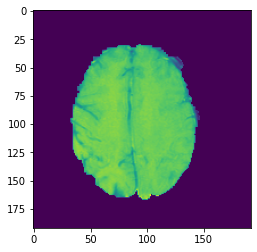

Predicted:- 


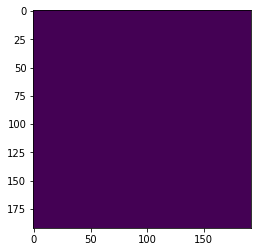

Actual:- 


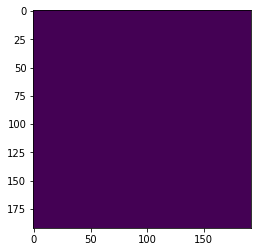

HGG test set no: 3 slice no: 491


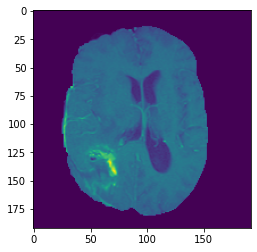

Predicted:- 


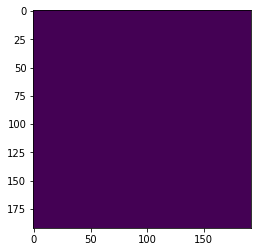

Actual:- 


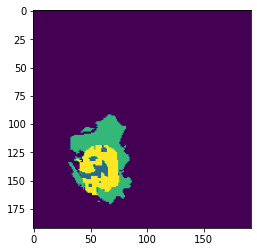

HGG test set no: 3 slice no: 492


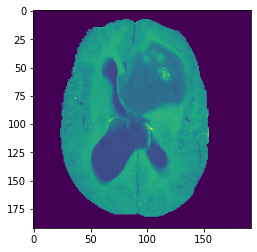

Predicted:- 


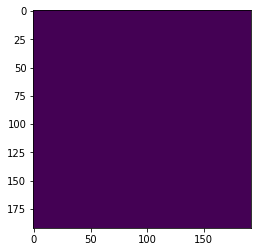

Actual:- 


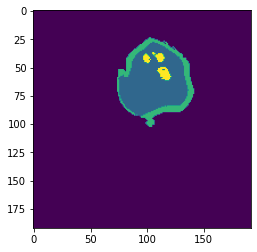

HGG test set no: 3 slice no: 493


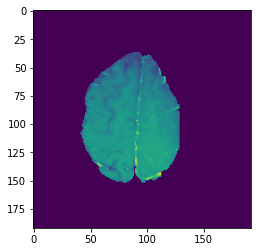

Predicted:- 


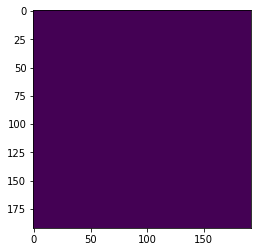

Actual:- 


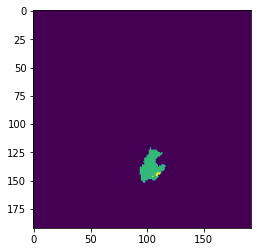

HGG test set no: 3 slice no: 494


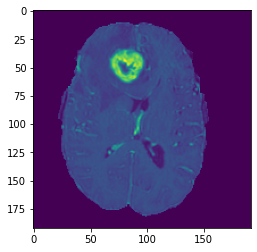

Predicted:- 


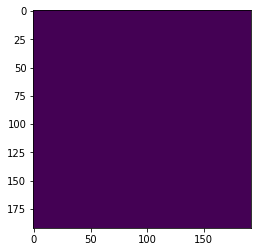

Actual:- 


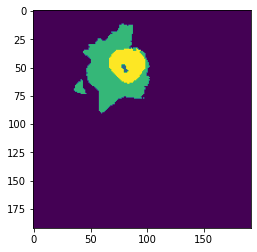

HGG test set no: 3 slice no: 495


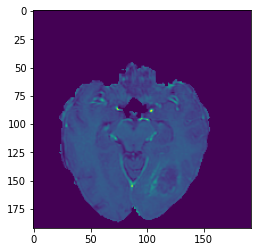

Predicted:- 


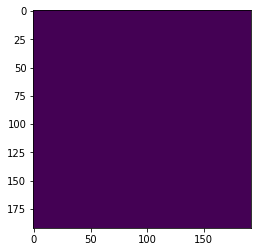

Actual:- 


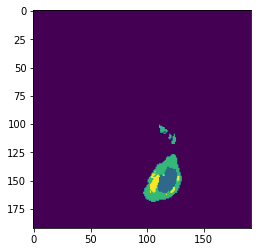

HGG test set no: 3 slice no: 496


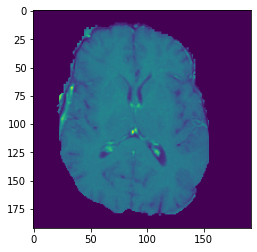

Predicted:- 


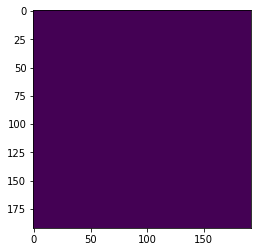

Actual:- 


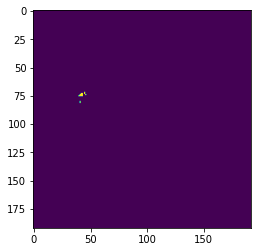

HGG test set no: 3 slice no: 497


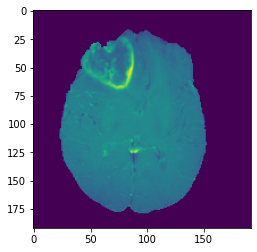

Predicted:- 


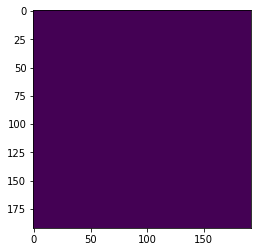

Actual:- 


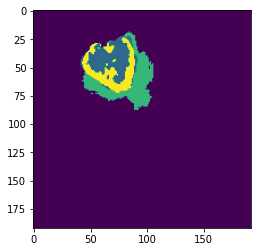

HGG test set no: 3 slice no: 498


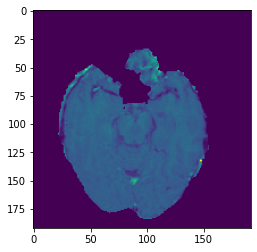

Predicted:- 


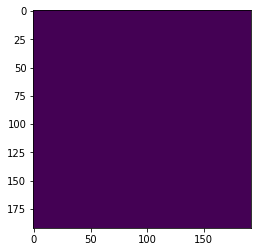

Actual:- 


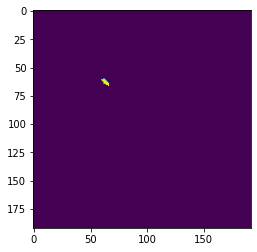

HGG test set no: 3 slice no: 499


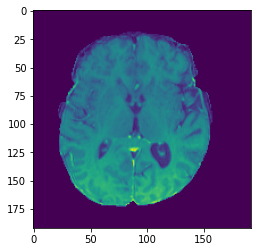

Predicted:- 


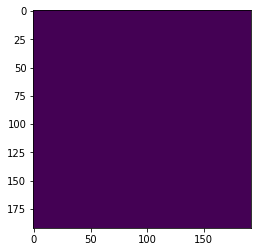

Actual:- 


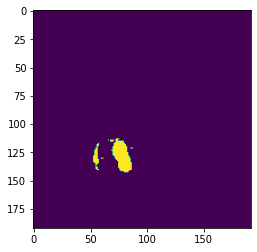

LGG test slice no: 450


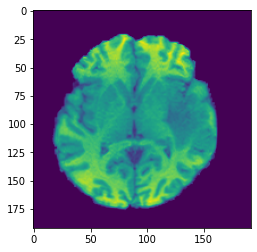

Predicted:- 


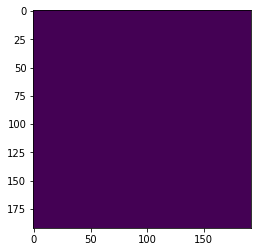

Actual:- 


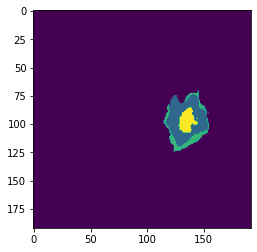

LGG test slice no: 451


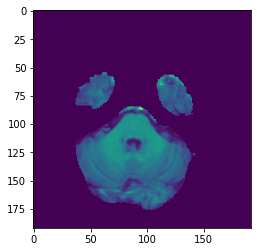

Predicted:- 


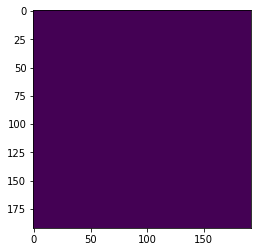

Actual:- 


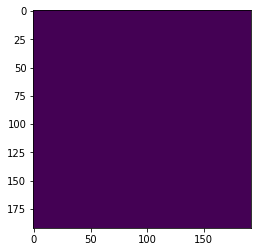

LGG test slice no: 452


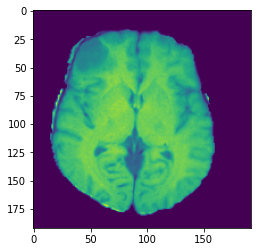

Predicted:- 


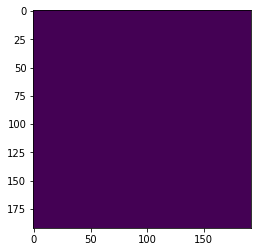

Actual:- 


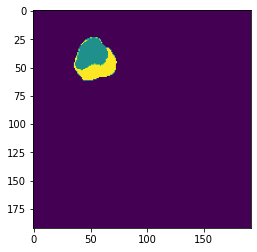

LGG test slice no: 453


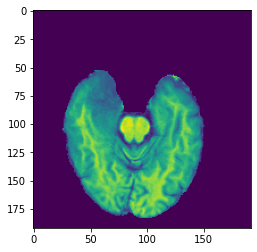

Predicted:- 


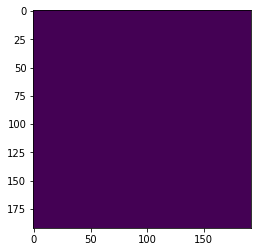

Actual:- 


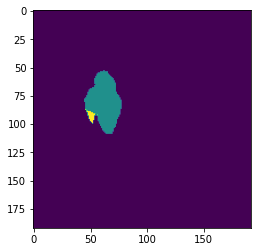

LGG test slice no: 454


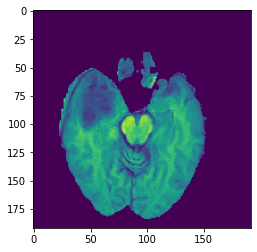

Predicted:- 


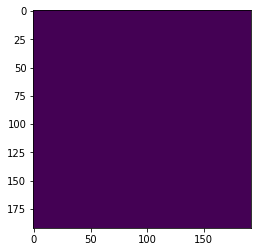

Actual:- 


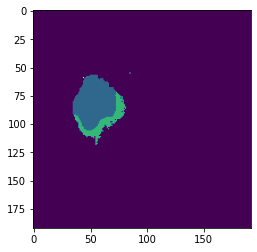

LGG test slice no: 455


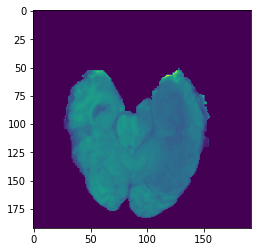

Predicted:- 


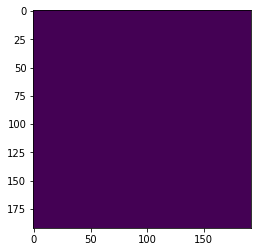

Actual:- 


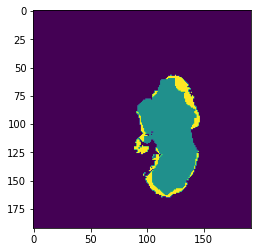

LGG test slice no: 456


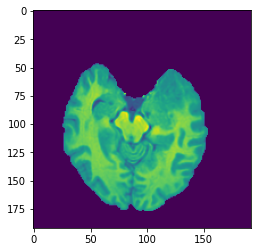

Predicted:- 


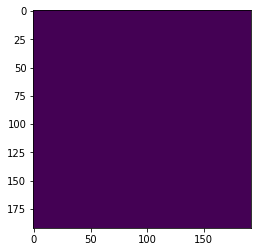

Actual:- 


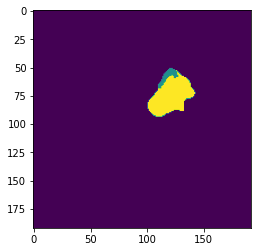

LGG test slice no: 457


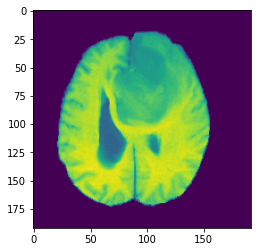

Predicted:- 


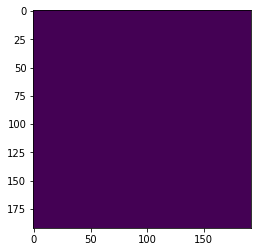

Actual:- 


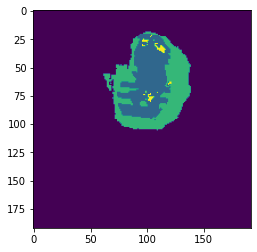

LGG test slice no: 458


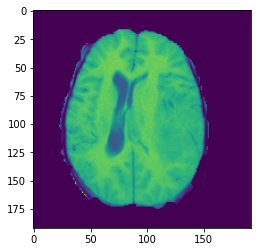

Predicted:- 


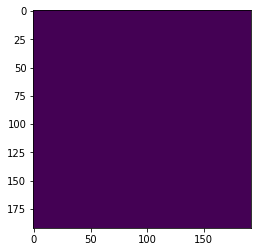

Actual:- 


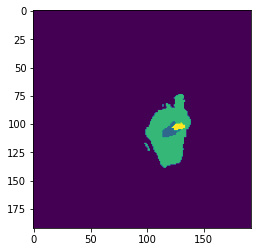

LGG test slice no: 459


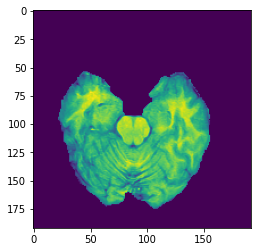

Predicted:- 


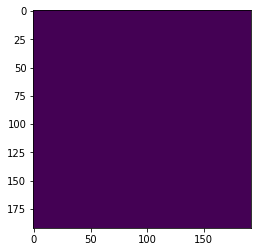

Actual:- 


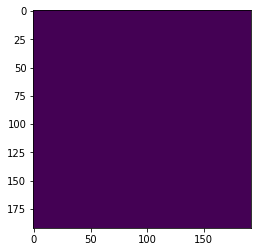

LGG test slice no: 460


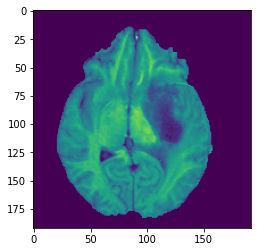

Predicted:- 


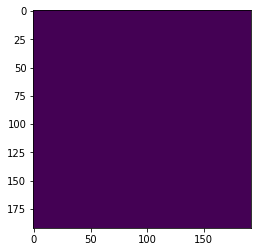

Actual:- 


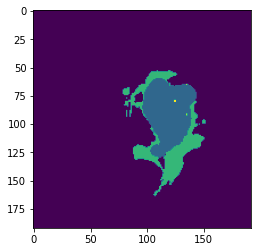

LGG test slice no: 461


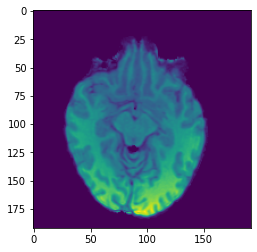

Predicted:- 


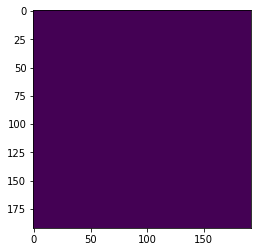

Actual:- 


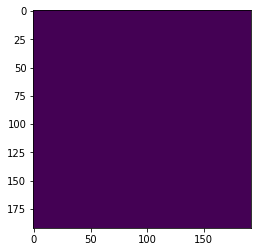

LGG test slice no: 462


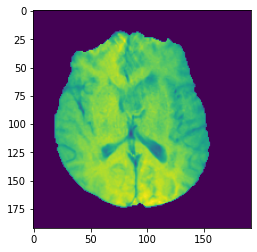

Predicted:- 


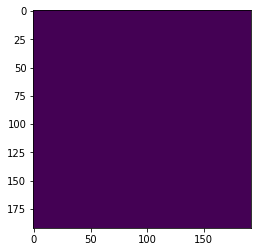

Actual:- 


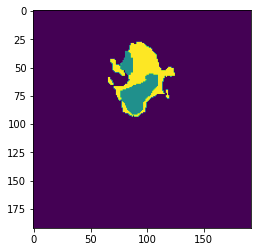

LGG test slice no: 463


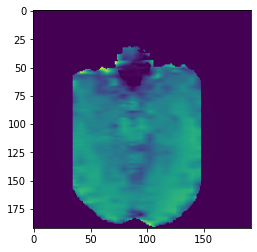

Predicted:- 


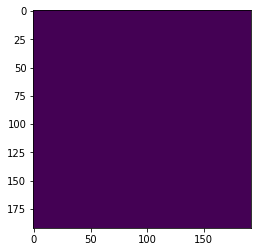

Actual:- 


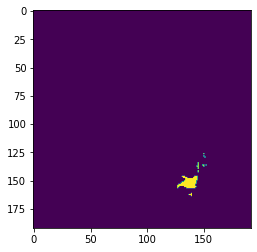

LGG test slice no: 464


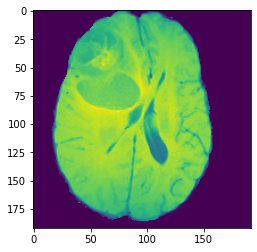

Predicted:- 


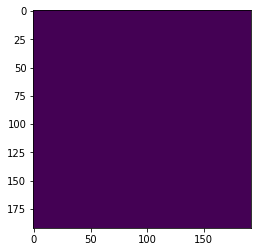

Actual:- 


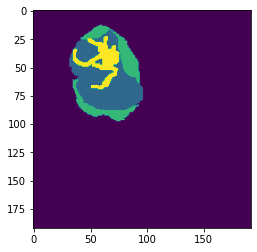

LGG test slice no: 465


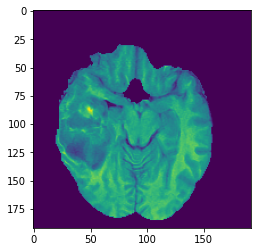

Predicted:- 


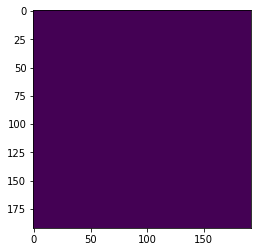

Actual:- 


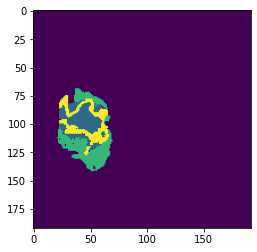

LGG test slice no: 466


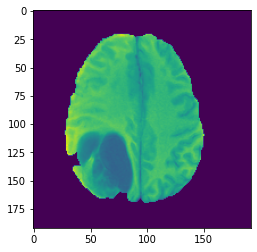

Predicted:- 


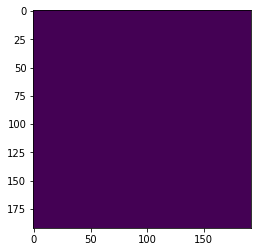

Actual:- 


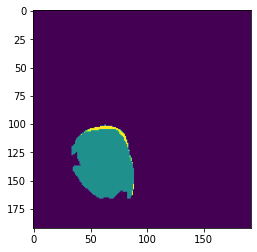

LGG test slice no: 467


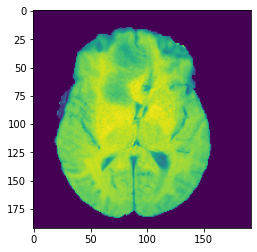

Predicted:- 


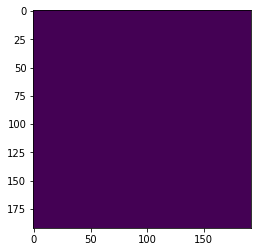

Actual:- 


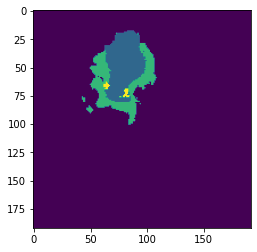

LGG test slice no: 468


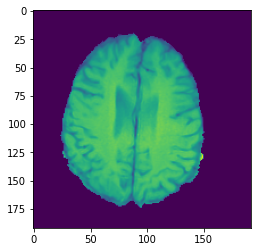

Predicted:- 


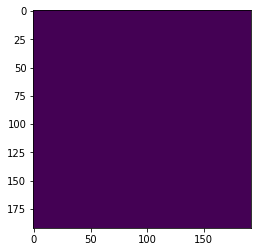

Actual:- 


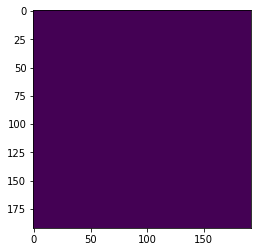

LGG test slice no: 469


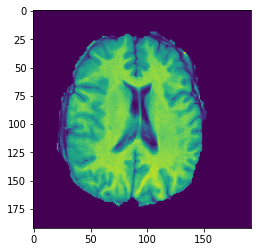

Predicted:- 


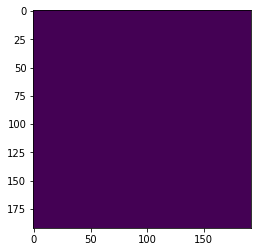

Actual:- 


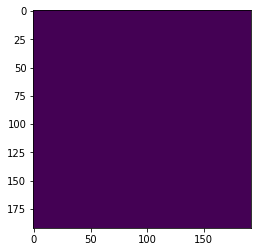

LGG test slice no: 470


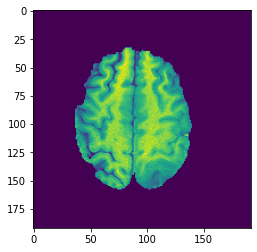

Predicted:- 


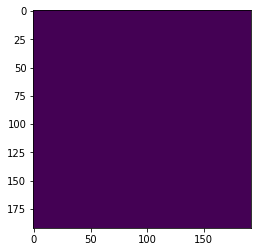

Actual:- 


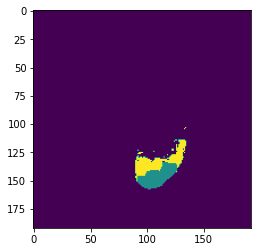

LGG test slice no: 471


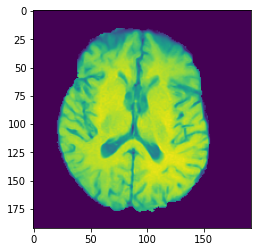

Predicted:- 


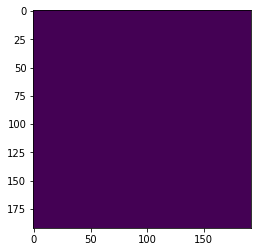

Actual:- 


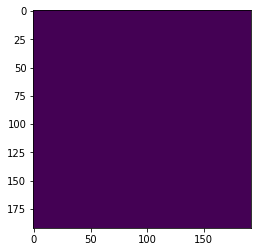

LGG test slice no: 472


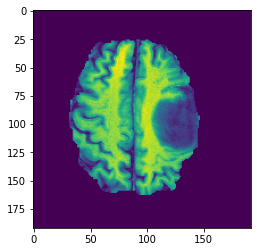

Predicted:- 


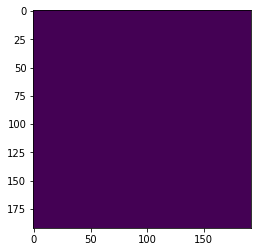

Actual:- 


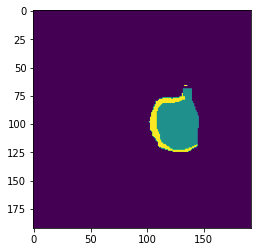

LGG test slice no: 473


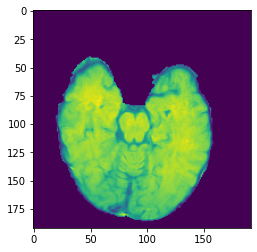

Predicted:- 


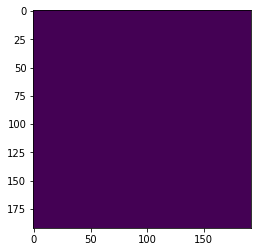

Actual:- 


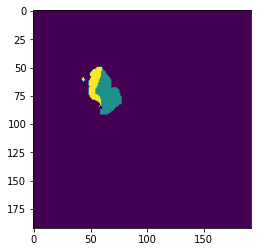

LGG test slice no: 474


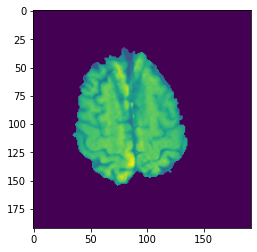

Predicted:- 


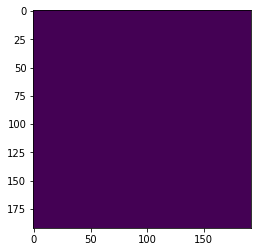

Actual:- 


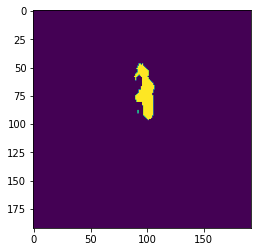

LGG test slice no: 475


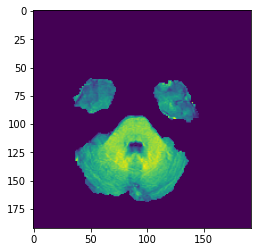

Predicted:- 


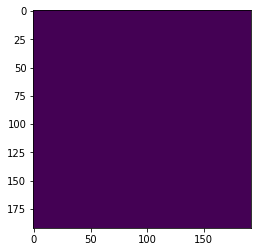

Actual:- 


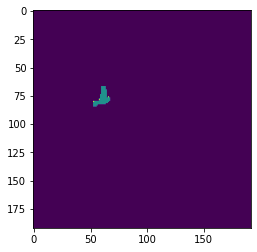

LGG test slice no: 476


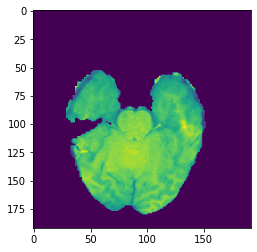

Predicted:- 


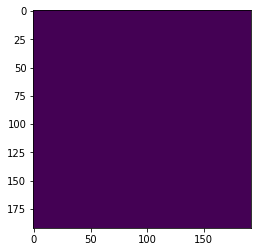

Actual:- 


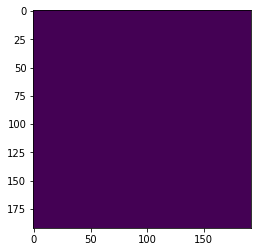

LGG test slice no: 477


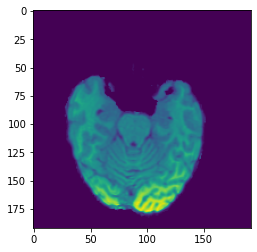

Predicted:- 


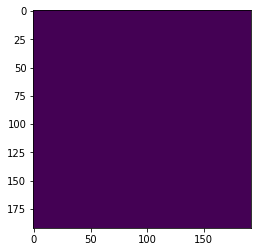

Actual:- 


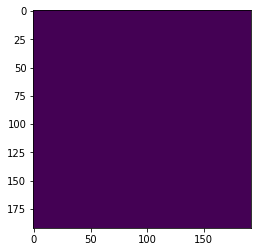

LGG test slice no: 478


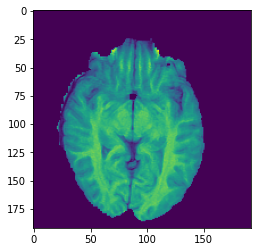

Predicted:- 


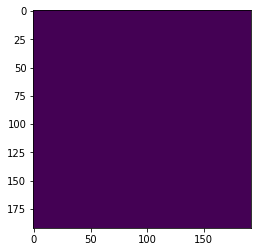

Actual:- 


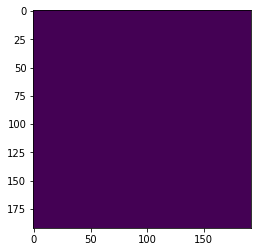

LGG test slice no: 479


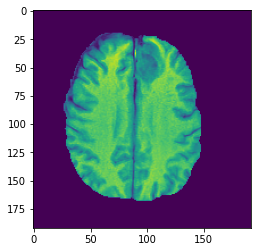

Predicted:- 


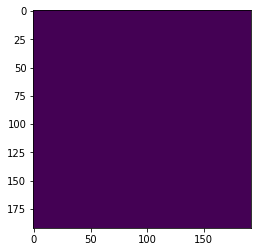

Actual:- 


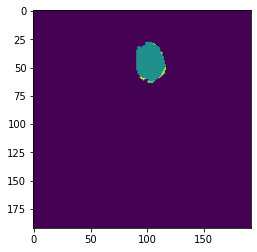

LGG test slice no: 480


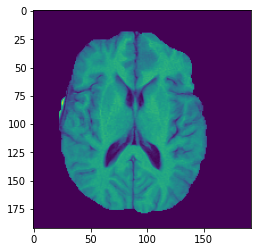

Predicted:- 


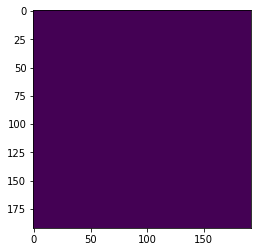

Actual:- 


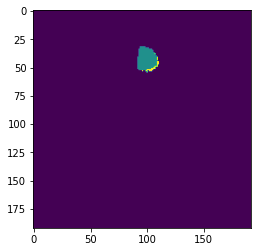

LGG test slice no: 481


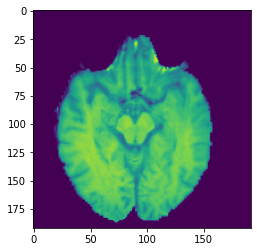

Predicted:- 


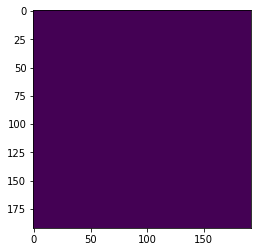

Actual:- 


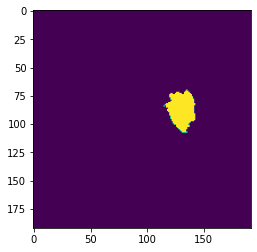

LGG test slice no: 482


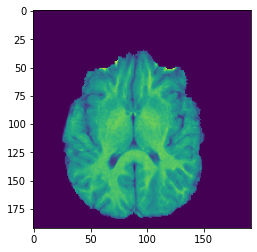

Predicted:- 


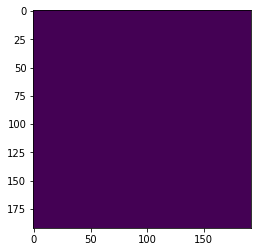

Actual:- 


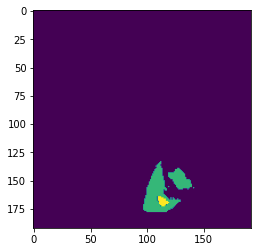

LGG test slice no: 483


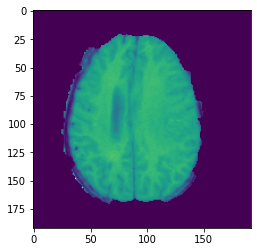

Predicted:- 


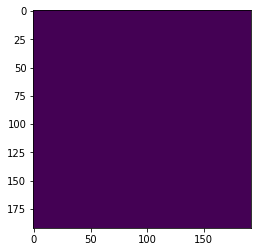

Actual:- 


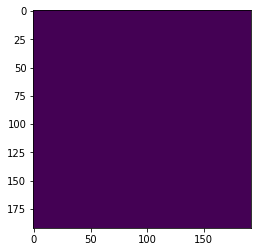

LGG test slice no: 484


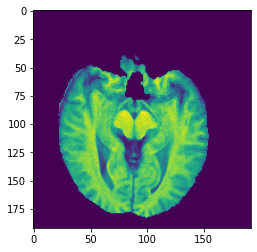

Predicted:- 


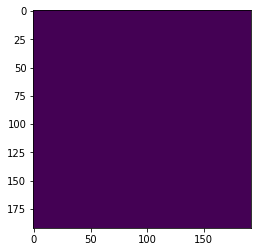

Actual:- 


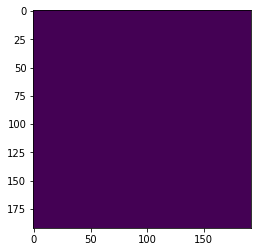

LGG test slice no: 485


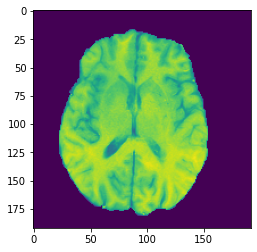

Predicted:- 


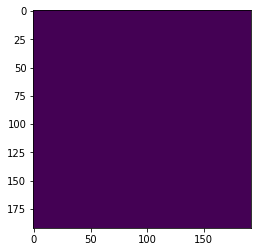

Actual:- 


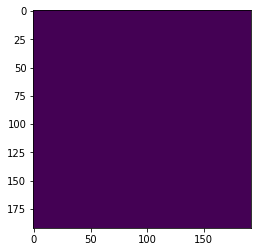

LGG test slice no: 486


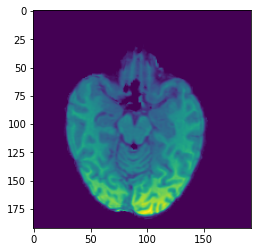

Predicted:- 


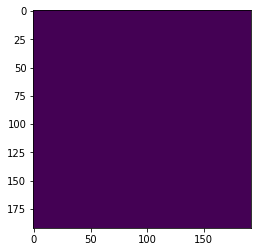

Actual:- 


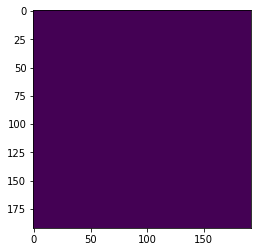

LGG test slice no: 487


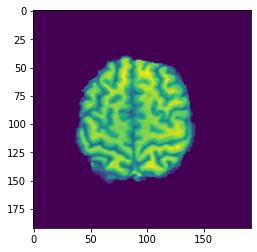

Predicted:- 


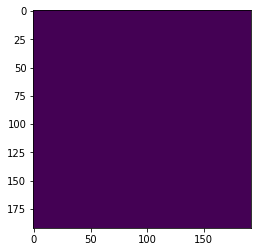

Actual:- 


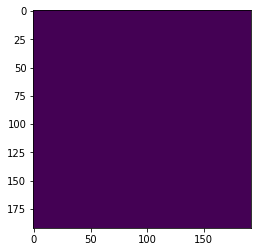

LGG test slice no: 488


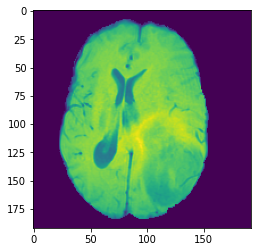

Predicted:- 


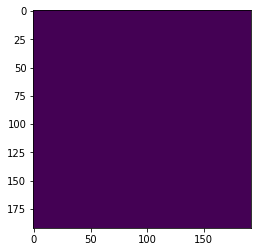

Actual:- 


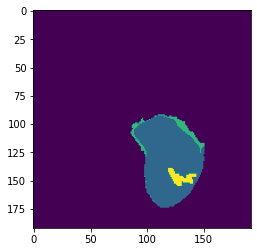

LGG test slice no: 489


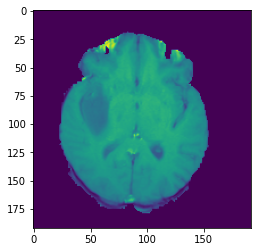

Predicted:- 


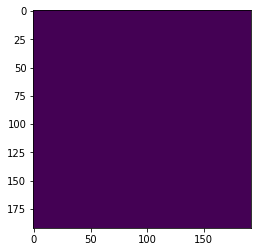

Actual:- 


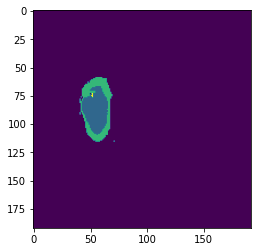

LGG test slice no: 490


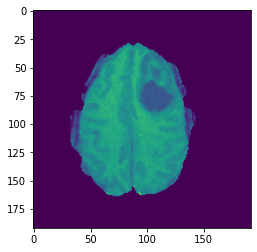

Predicted:- 


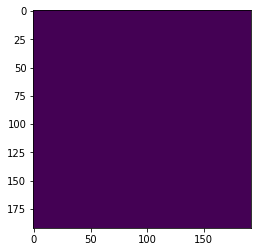

Actual:- 


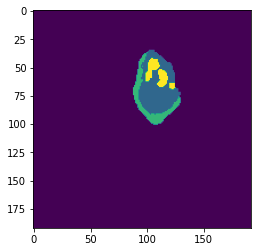

LGG test slice no: 491


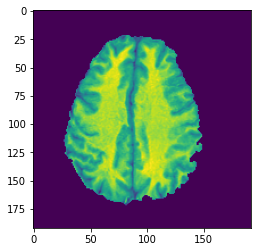

Predicted:- 


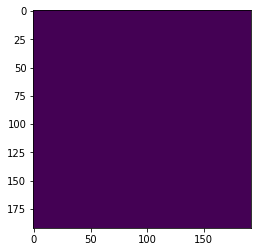

Actual:- 


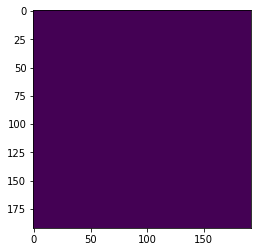

LGG test slice no: 492


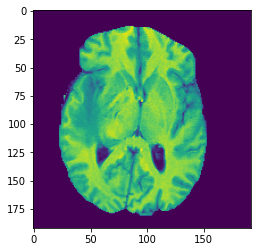

Predicted:- 


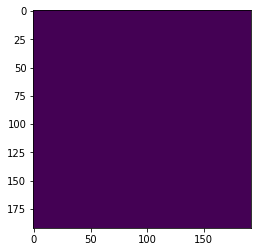

Actual:- 


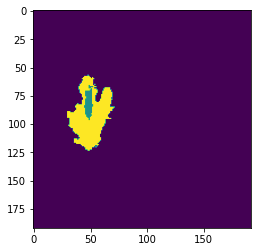

LGG test slice no: 493


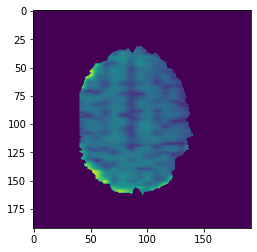

Predicted:- 


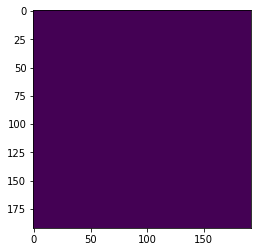

Actual:- 


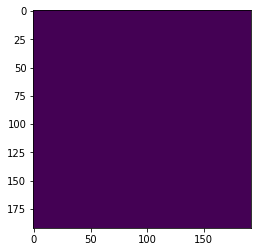

LGG test slice no: 494


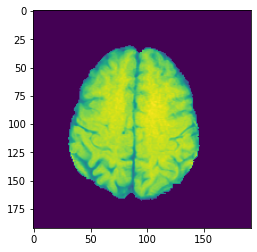

Predicted:- 


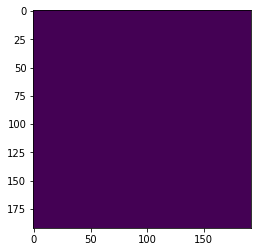

Actual:- 


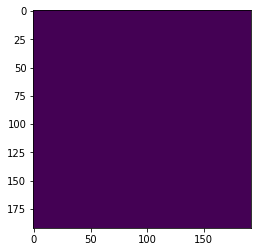

LGG test slice no: 495


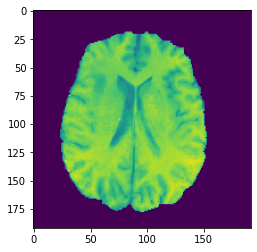

Predicted:- 


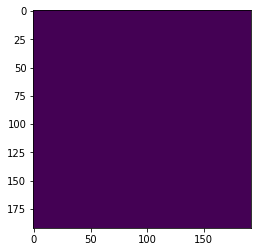

Actual:- 


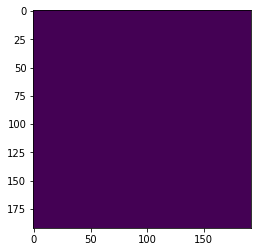

LGG test slice no: 496


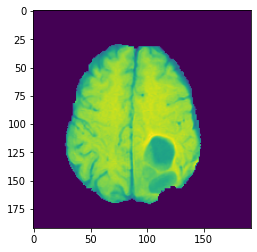

Predicted:- 


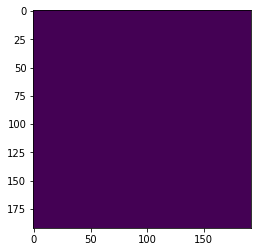

Actual:- 


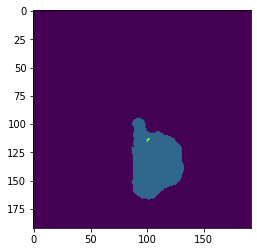

LGG test slice no: 497


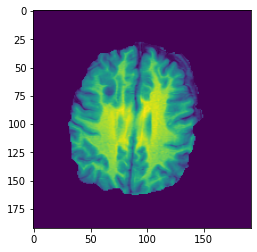

Predicted:- 


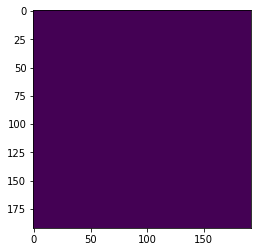

Actual:- 


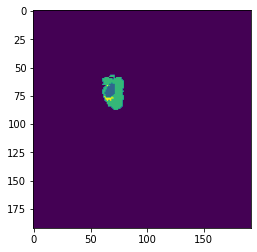

LGG test slice no: 498


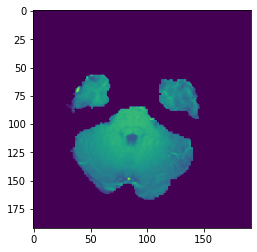

Predicted:- 


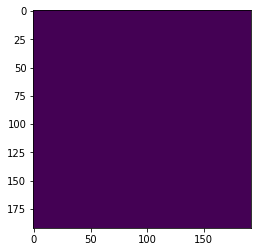

Actual:- 


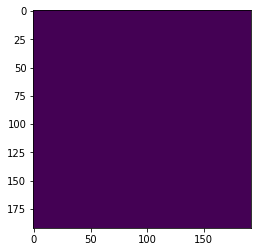

LGG test slice no: 499


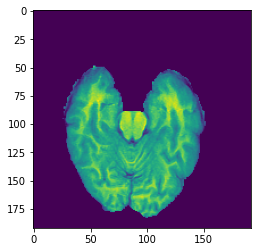

Predicted:- 


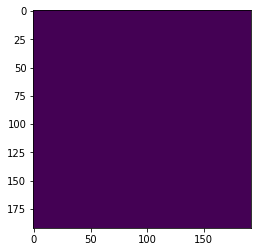

Actual:- 


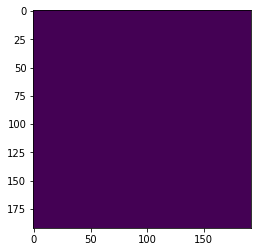

In [ ]:
import matplotlib.pyplot as plt
for i in range(450,500):
  print('HGG test set no: 1 '+ 'slice no: ' + str(i))
  plt.imshow(X_test1[i,:,:,2])
  plt.show()
  print('Predicted:- ')
  plt.imshow(Y_pred1[i,:,:,0])
  plt.show()
  print('Actual:- ')
  plt.imshow(Y_test1[i,:,:,0])
  plt.show()
for i in range(450,500):
  print('HGG test set no: 2 '+ 'slice no: ' + str(i))
  plt.imshow(X_test2[i,:,:,2])
  plt.show()
  print('Predicted:- ')
  plt.imshow(Y_pred2[i,:,:,0])
  plt.show()
  print('Actual:- ')
  plt.imshow(Y_test2[i,:,:,0])
  plt.show()
for i in range(450,500):
  print('HGG test set no: 3 '+ 'slice no: ' + str(i))
  plt.imshow(X_test3[i,:,:,2])
  plt.show()
  print('Predicted:- ')
  plt.imshow(Y_pred3[i,:,:,0])
  plt.show()
  print('Actual:- ')
  plt.imshow(Y_test3[i,:,:,0])
  plt.show()
for i in range(450,500):
  print('LGG test slice no: ' + str(i))
  plt.imshow(X_test4[i,:,:,1])
  plt.show()
  print('Predicted:- ')
  plt.imshow(Y_pred4[i,:,:,0])
  plt.show()
  print('Actual:- ')
  plt.imshow(Y_test4[i,:,:,0])
  plt.show()